In [183]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import collections as matcoll
import seaborn
seaborn.set(font_scale = 2)

import scipy.stats as stats
from sklearn import preprocessing

# Stock Price Data

In [2]:
price = pd.read_csv("Stock Prices.csv",index_col='Date', parse_dates=True, dayfirst=True)

In [3]:
price.head()

,ATVI,TTWO,GME,ZNGA
Date,,,,
2018-03-09,76.694267,116.610001,14.185772,3.72
2018-03-12,75.360802,115.739998,13.917271,3.75
2018-03-13,74.448944,113.489998,13.970971,3.70
2018-03-14,72.772293,109.230003,13.836721,3.77
2018-03-15,71.948677,108.900002,13.702471,3.86


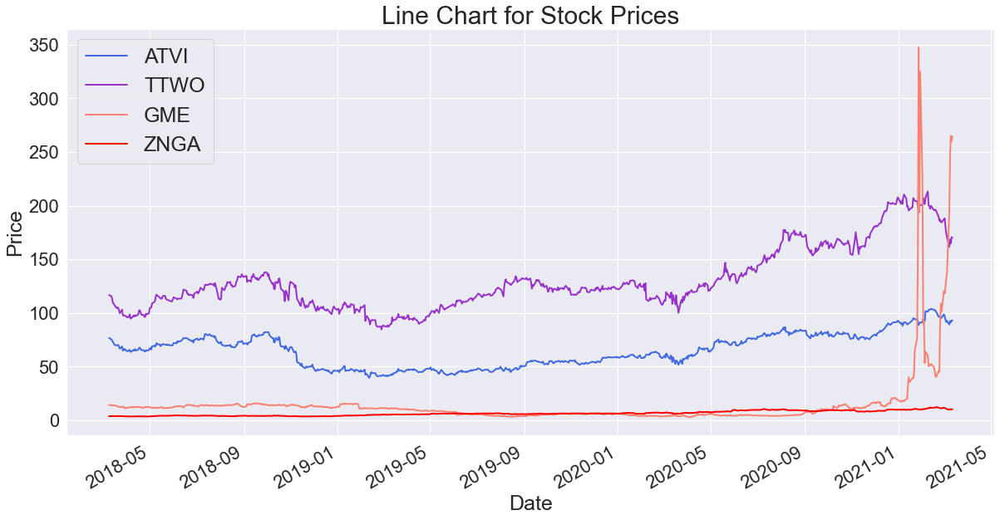

In [4]:
price.plot(figsize=(20,10), linewidth = 2, color = ['royalblue', 'darkorchid', 'salmon', 'red'])
plt.title("Line Chart for Stock Prices", fontsize=30)
plt.xlabel("Date", fontsize = 25)
plt.ylabel("Price", fontsize = 25)
plt.legend(prop={'size': 25})

# Return Data

In [5]:
df = pd.read_csv("Data.csv",index_col='Date', parse_dates=True, dayfirst=True)
df.head()

,ATVI,TTWO,GME,ZNGA
Date,,,,
2018-03-12,-0.010127,-0.004324,-0.011033,0.004637
2018-03-13,-0.012174,-0.019632,0.003851,-0.013423
2018-03-14,-0.022778,-0.038259,-0.009656,0.018742
2018-03-15,-0.011382,-0.003026,-0.009750,0.023592
2018-03-16,-0.023440,-0.014895,0.007159,-0.010417


Text(0.5, 0, 'Date')

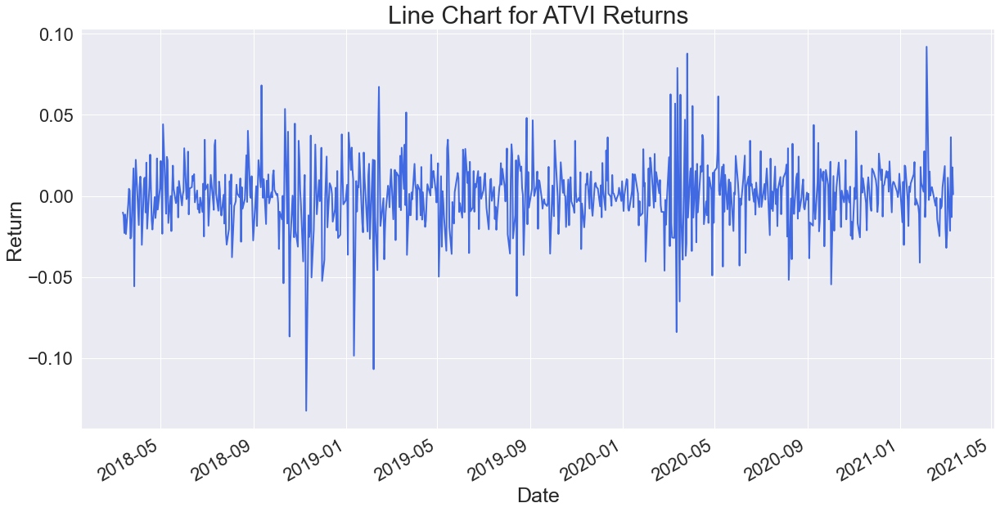

In [6]:
df['ATVI'].plot(figsize=(20,10), linewidth = 2, color = ['royalblue'])
plt.title("Line Chart for ATVI Returns", fontsize=30)
plt.ylabel("Return", fontsize = 25)
plt.xlabel("Date", fontsize = 25)

Text(0.5, 0, 'Date')

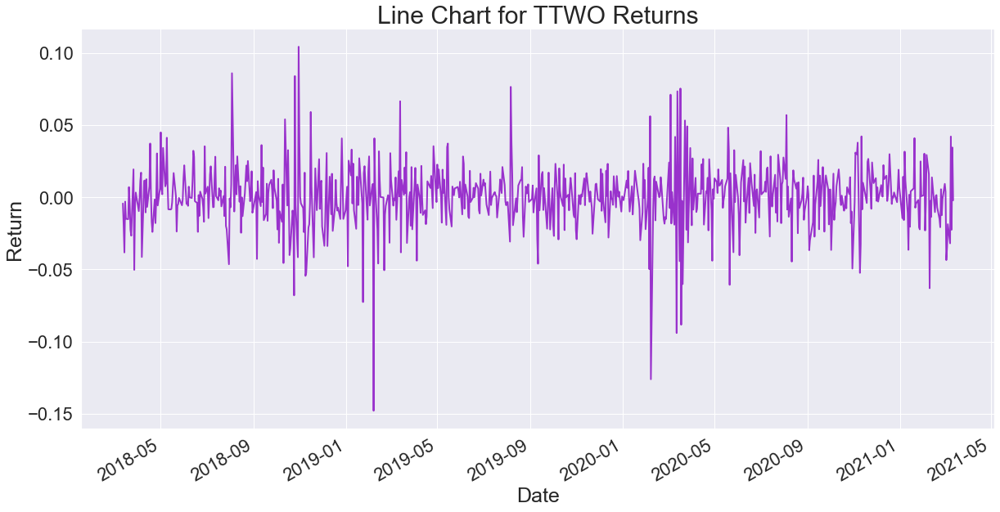

In [7]:
df['TTWO'].plot(figsize=(20,10), linewidth = 2, color = ['darkorchid'])
plt.title("Line Chart for TTWO Returns", fontsize=30)
plt.ylabel("Return", fontsize = 25)
plt.xlabel("Date", fontsize = 25)

Text(0.5, 0, 'Date')

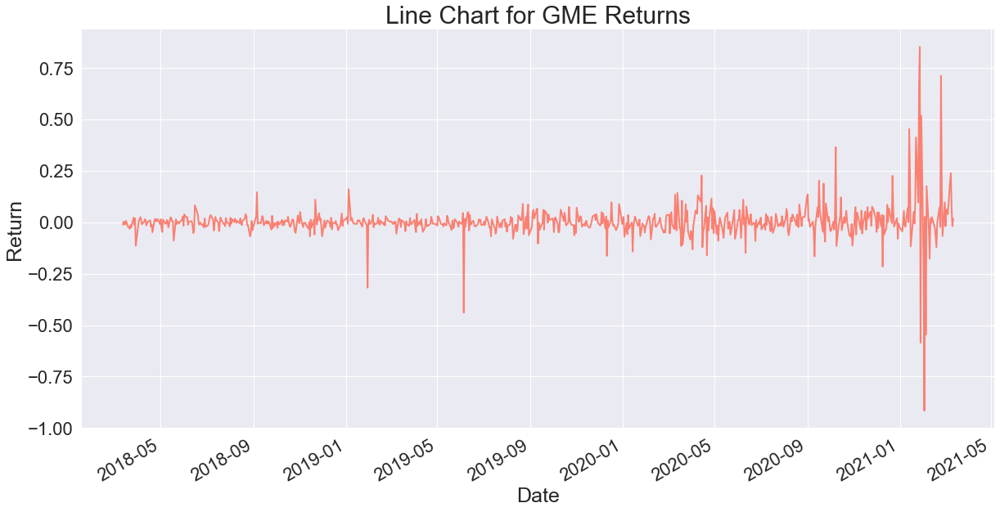

In [8]:
df['GME'].plot(figsize=(20,10), linewidth = 2, color = ['salmon'])
plt.title("Line Chart for GME Returns", fontsize=30)
plt.ylabel("Return", fontsize = 25)
plt.xlabel("Date", fontsize = 25)

Text(0.5, 0, 'Date')

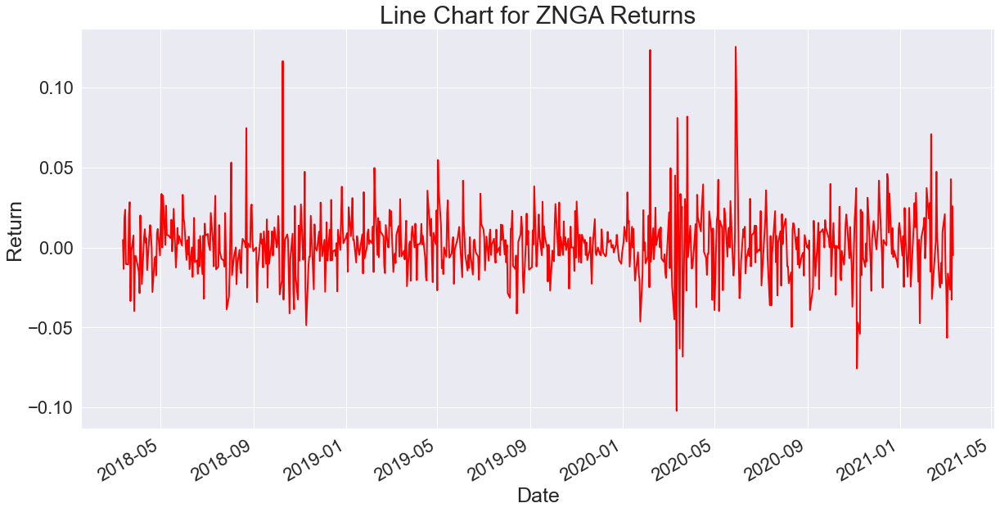

In [9]:
df['ZNGA'].plot(figsize=(20,10), linewidth = 2, color = ['red'])
plt.title("Line Chart for ZNGA Returns", fontsize=30)
plt.ylabel("Return", fontsize = 25)
plt.xlabel("Date", fontsize = 25)

# Serial Correlation

In [10]:
auto_corr = pd.DataFrame()
auto_corr['S_No'] = list(range(1,101))

In [11]:
auto_corr["ATVI"] = [df["ATVI"].autocorr(lag = i) for i in range(1,101)]
auto_corr["TTWO"] = [df["TTWO"].autocorr(lag = i) for i in range(1,101)]
auto_corr["GME"] = [df["GME"].autocorr(lag = i) for i in range(1,101)]
auto_corr["ZNGA"] = [df["ZNGA"].autocorr(lag = i) for i in range(1,101)]

In [12]:
auto_corr.head()

,S_No,ATVI,TTWO,GME,ZNGA
0,1,-0.124224,-0.158602,0.001830,-0.062703
1,2,-0.010887,0.019301,0.112558,0.006106
2,3,0.037628,-0.015828,0.205882,-0.051267
3,4,-0.052022,-0.025767,-0.260245,0.000738
4,5,-0.084707,-0.095740,0.039665,-0.063475


Text(0, 0.5, 'Autocorrelation')

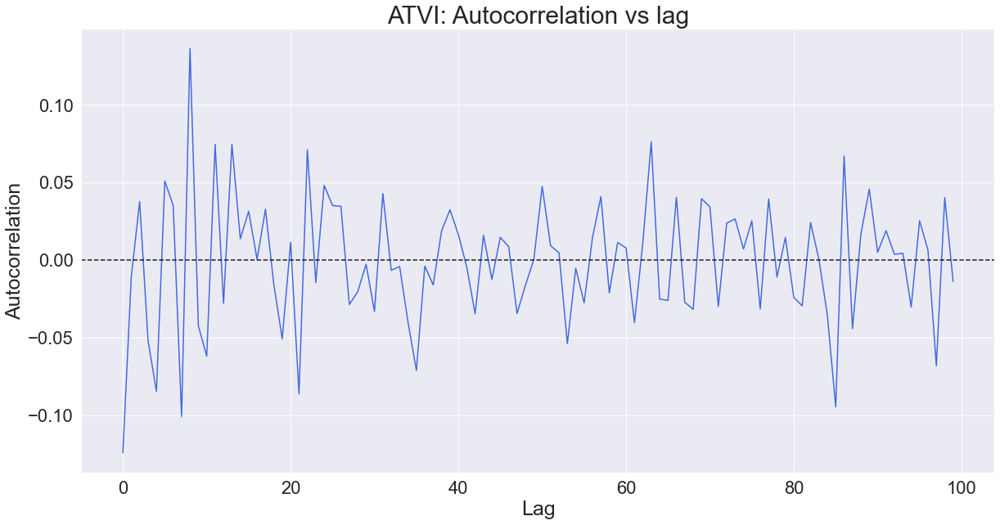

In [13]:
plt.figure(figsize=(20,10))
auto_corr["ATVI"].plot(color = 'royalblue')
plt.axhline(y=0, color='k', linestyle='--')
plt.title("ATVI: Autocorrelation vs lag", fontsize = 30)
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Autocorrelation", fontsize = 25)

Text(0, 0.5, 'Autocorrelation')

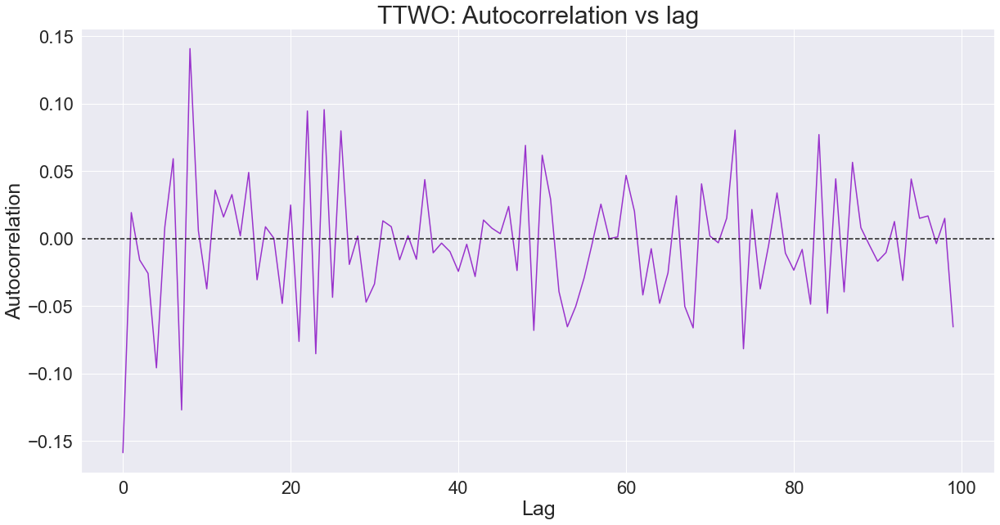

In [14]:
plt.figure(figsize=(20,10))
auto_corr["TTWO"].plot(color = 'darkorchid')
plt.axhline(y=0, color='k', linestyle='--')
plt.title("TTWO: Autocorrelation vs lag", fontsize = 30)
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Autocorrelation", fontsize = 25)

Text(0, 0.5, 'Autocorrelation')

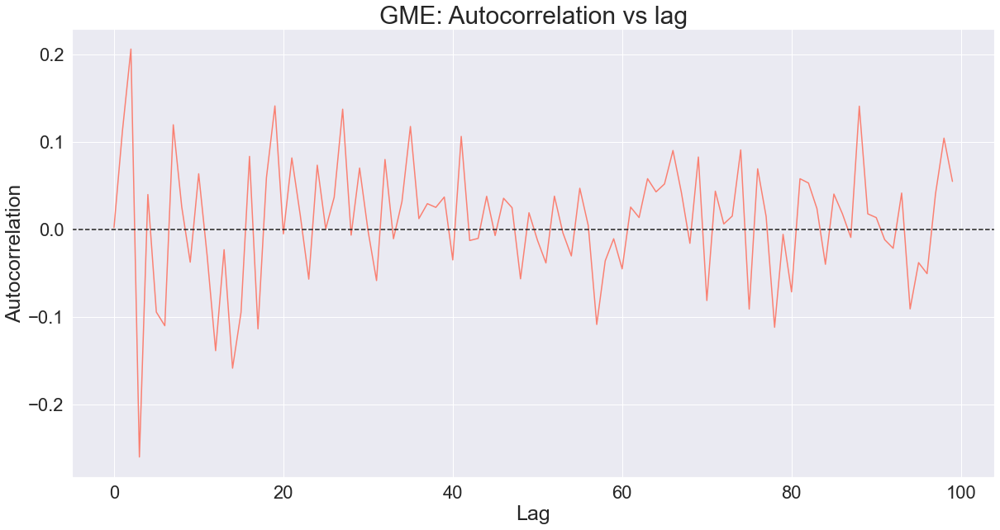

In [15]:
plt.figure(figsize=(20,10))
auto_corr["GME"].plot(color = "salmon")
plt.axhline(y=0, color='k', linestyle='--')
plt.title("GME: Autocorrelation vs lag", fontsize = 30)
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Autocorrelation", fontsize = 25)

Text(0, 0.5, 'Autocorrelation')

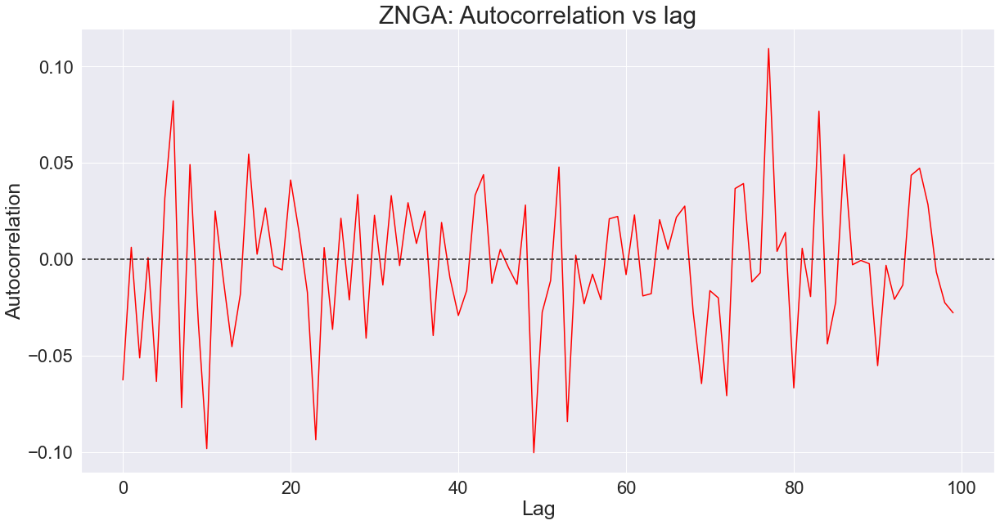

In [16]:
plt.figure(figsize=(20,10))
auto_corr["ZNGA"].plot(color = "red")
plt.axhline(y=0, color='k', linestyle='--')
plt.title("ZNGA: Autocorrelation vs lag", fontsize = 30)
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Autocorrelation", fontsize = 25)

In [17]:
from statsmodels.regression.linear_model import OLS
from statsmodels.stats.stattools import durbin_watson

def dw(data):
    ols_res = OLS(data, np.ones(len(data))).fit()
    return durbin_watson(ols_res.resid)

#which should not be correlated, thus giving a value close to 2
print("DW of ATVI = %f" % dw(df["ATVI"]))
print("DW of TTWO = %f" % dw(df["TTWO"]))
print("DW of GME = %f" % dw(df["GME"]))
print("DW of ZNGA = %f" % dw(df["ZNGA"]))

DW of ATVI = 2.248083
DW of TTWO = 2.317099
DW of GME = 1.996274
DW of ZNGA = 2.125236


# Squared Returns Analysis

In [18]:
df_sq = pd.DataFrame()

for column in df.columns:
    df_sq[column] = df[column]**2

In [19]:
#which should not be correlated, thus giving a value close to 2
print("DW of ATVI = %f" % dw(df_sq["ATVI"]))
print("DW of TTWO = %f" % dw(df_sq["TTWO"]))
print("DW of GME = %f" % dw(df_sq["GME"]))
print("DW of ZNGA = %f" % dw(df_sq["ZNGA"]))

DW of ATVI = 1.808108
DW of TTWO = 1.685709
DW of GME = 1.315712
DW of ZNGA = 1.731361


In [20]:
len(df_sq["ATVI"])

757

In [21]:
auto_corr_sq = pd.DataFrame()
auto_corr_sq['S_No'] = list(range(1,101))

auto_corr_sq["ATVI"] = [df_sq["ATVI"].autocorr(lag = i) for i in range(1,101)]
auto_corr_sq["TTWO"] = [df_sq["TTWO"].autocorr(lag = i) for i in range(1,101)]
auto_corr_sq["GME"] = [df_sq["GME"].autocorr(lag = i) for i in range(1,101)]
auto_corr_sq["ZNGA"] = [df_sq["ZNGA"].autocorr(lag = i) for i in range(1,101)]

Text(0, 0.5, 'Autocorrelation')

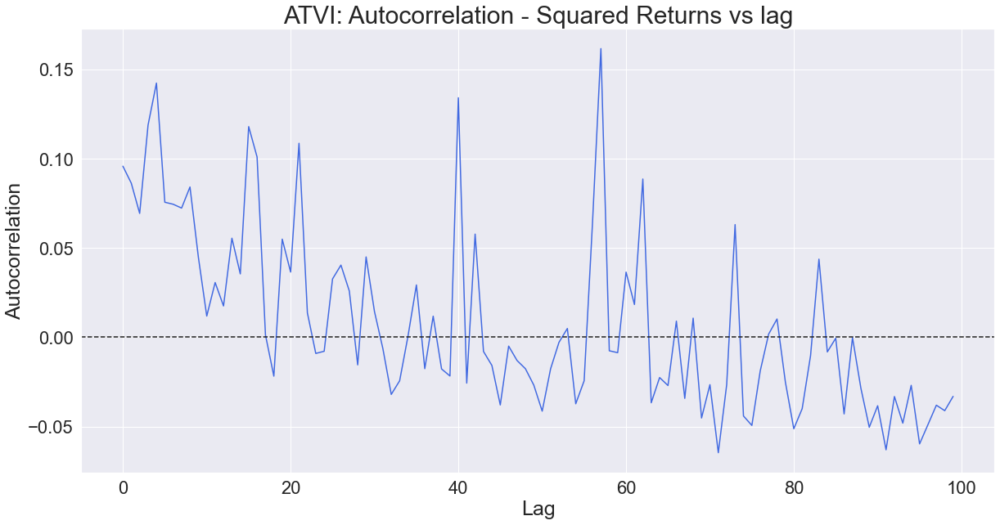

In [22]:
plt.figure(figsize=(20,10))
auto_corr_sq["ATVI"].plot(color = "royalblue")
plt.axhline(y=0, color='k', linestyle='--')
plt.title("ATVI: Autocorrelation - Squared Returns vs lag", fontsize = 30)
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Autocorrelation", fontsize = 25)

Text(0, 0.5, 'Autocorrelation')

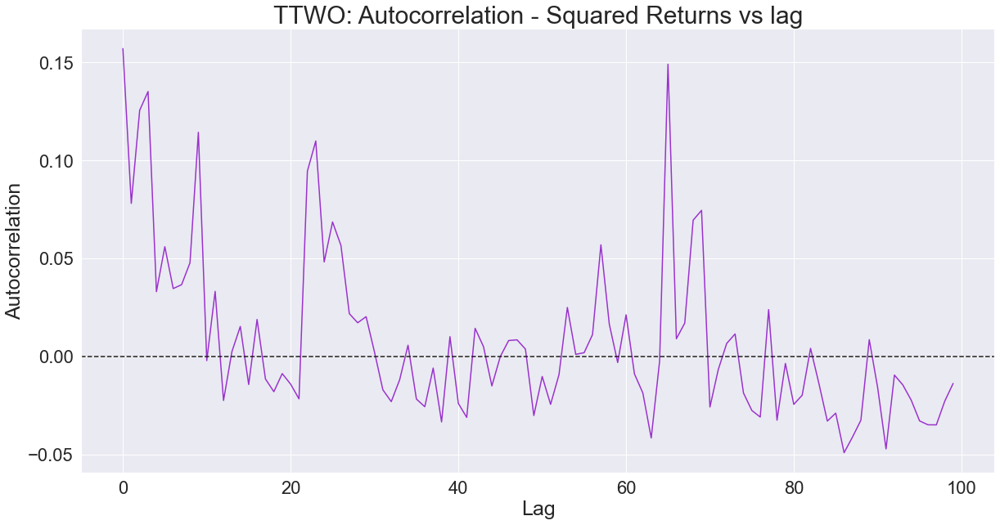

In [23]:
plt.figure(figsize=(20,10))
auto_corr_sq["TTWO"].plot(color = "darkorchid")
plt.axhline(y=0, color='k', linestyle='--')
plt.title("TTWO: Autocorrelation - Squared Returns vs lag", fontsize = 30)
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Autocorrelation", fontsize = 25)

Text(0, 0.5, 'Autocorrelation')

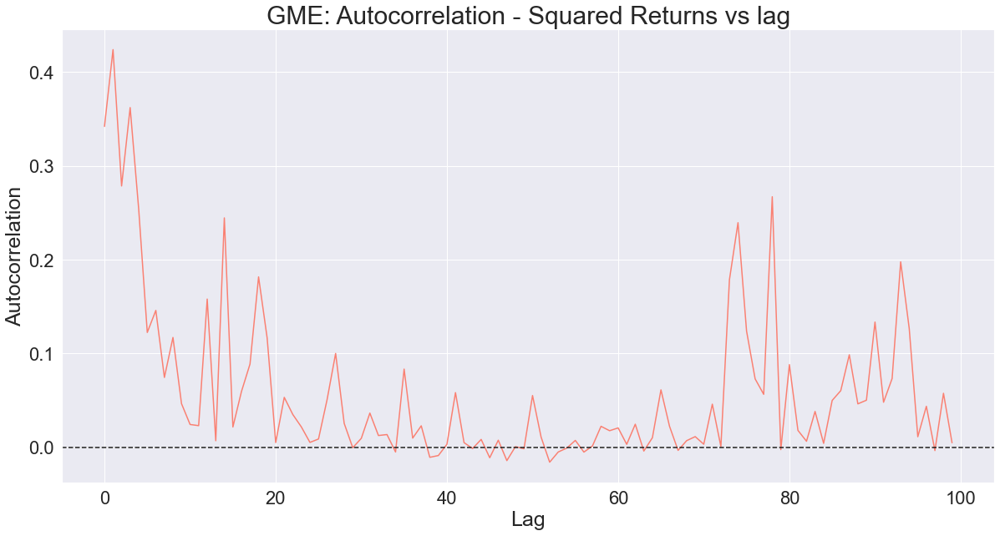

In [24]:
plt.figure(figsize=(20,10))
auto_corr_sq["GME"].plot(color = "salmon")
plt.axhline(y=0, color='k', linestyle='--')
plt.title("GME: Autocorrelation - Squared Returns vs lag", fontsize = 30)
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Autocorrelation", fontsize = 25)

Text(0, 0.5, 'Autocorrelation')

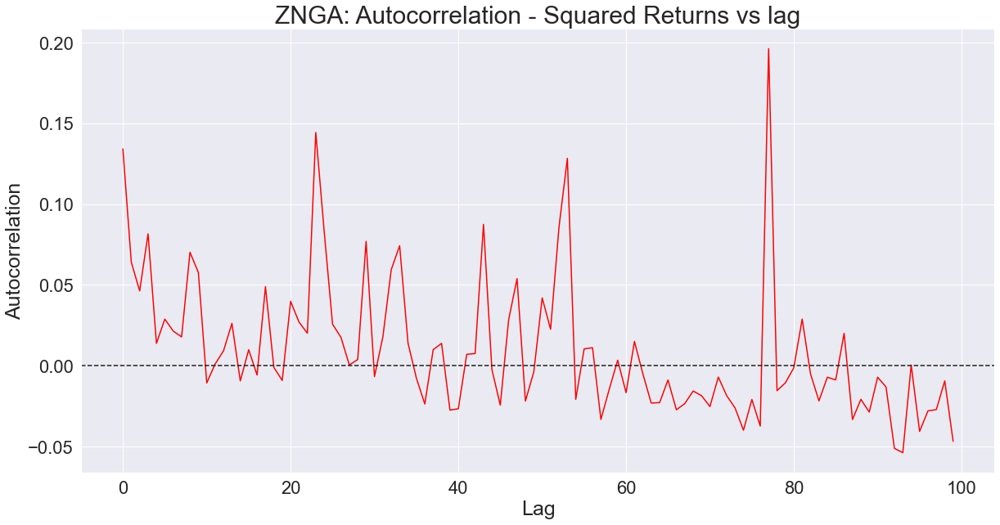

In [25]:
plt.figure(figsize=(20,10))
auto_corr_sq["ZNGA"].plot(color = "red")
plt.axhline(y=0, color='k', linestyle='--')
plt.title("ZNGA: Autocorrelation - Squared Returns vs lag", fontsize = 30)
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Autocorrelation", fontsize = 25)

## Plotting

Text(0.5, 0, 'Date')

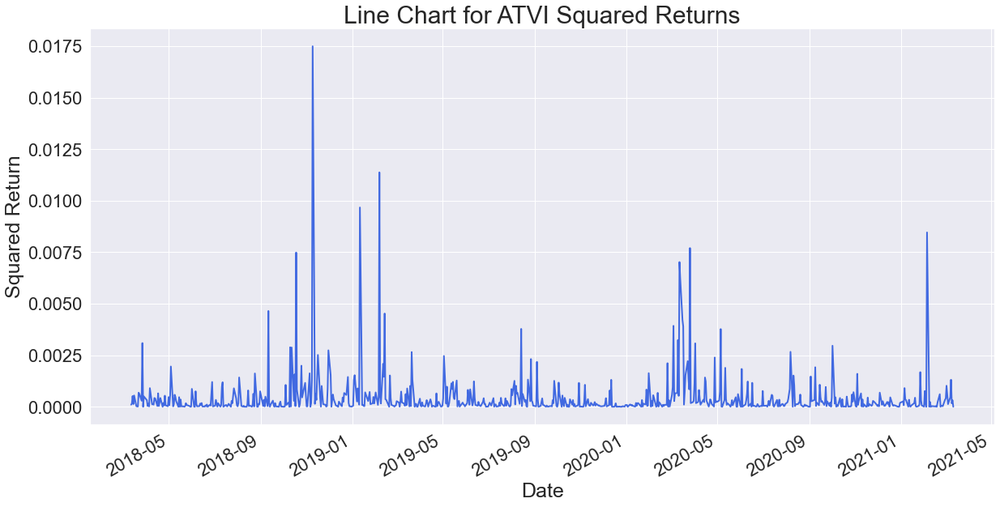

In [26]:
df_sq['ATVI'].plot(figsize=(20,10), linewidth = 2, color = ['royalblue'])
plt.title("Line Chart for ATVI Squared Returns", fontsize=30)
plt.ylabel("Squared Return", fontsize = 25)
plt.xlabel("Date", fontsize = 25)

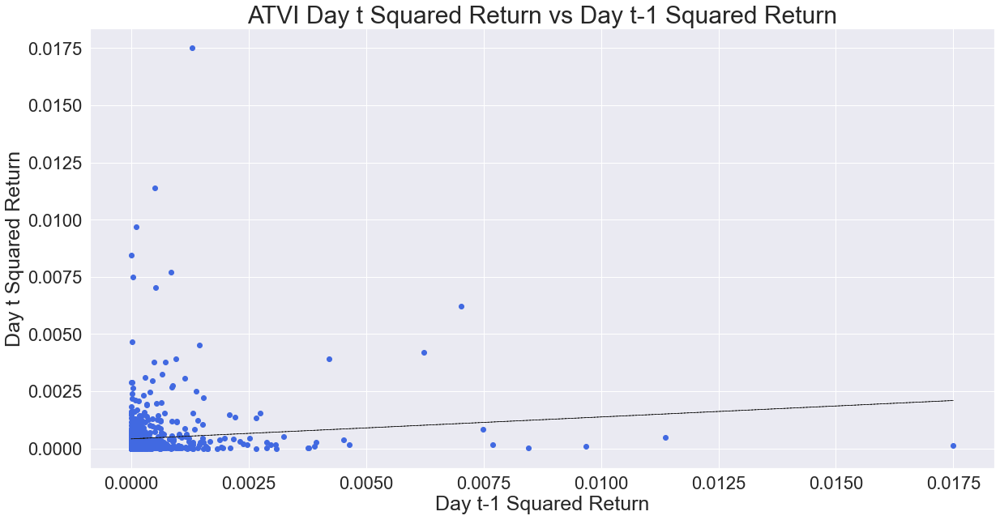

In [27]:
#ATVI
slope, intercept, r_value, p_value, std_err = stats.linregress(df_sq['ATVI'].shift(1)[1:],df_sq['ATVI'][1:])

abline_values = [slope * i + intercept for i in df_sq['ATVI'].shift(1)]

plt.figure(figsize=(20,10))
plt.scatter(df_sq['ATVI'].shift(1),df_sq['ATVI'], color = "royalblue")
plt.title("ATVI Day t Squared Return vs Day t-1 Squared Return", fontsize = 30)
plt.ylabel("Day t Squared Return", fontsize = 25)
plt.xlabel("Day t-1 Squared Return", fontsize = 25)
plt.plot(df_sq['ATVI'].shift(1), abline_values, 'k--', linewidth = 0.75)

In [28]:
#ATVI
print("slope = ", slope)
print("intercept = ", intercept)
print("r_squared = ", r_value**2)
print("p_value = ", p_value)

slope =  0.09580268881924744
intercept =  0.0004166371260725805
r_squared =  0.00917742406670262
p_value =  0.008395421713047203


Text(0.5, 0, 'Date')

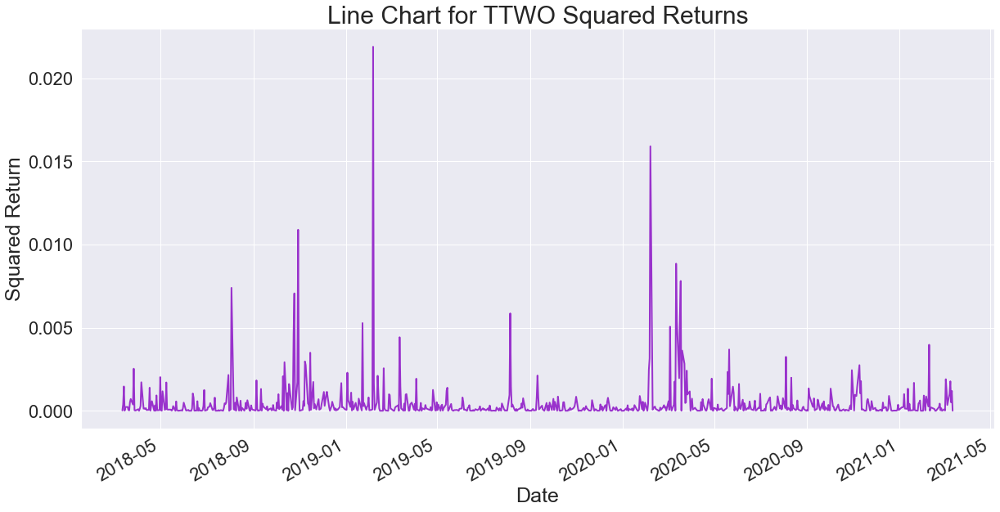

In [29]:
df_sq['TTWO'].plot(figsize=(20,10), linewidth = 2, color = ['darkorchid'])
plt.title("Line Chart for TTWO Squared Returns", fontsize=30)
plt.ylabel("Squared Return", fontsize = 25)
plt.xlabel("Date", fontsize = 25)

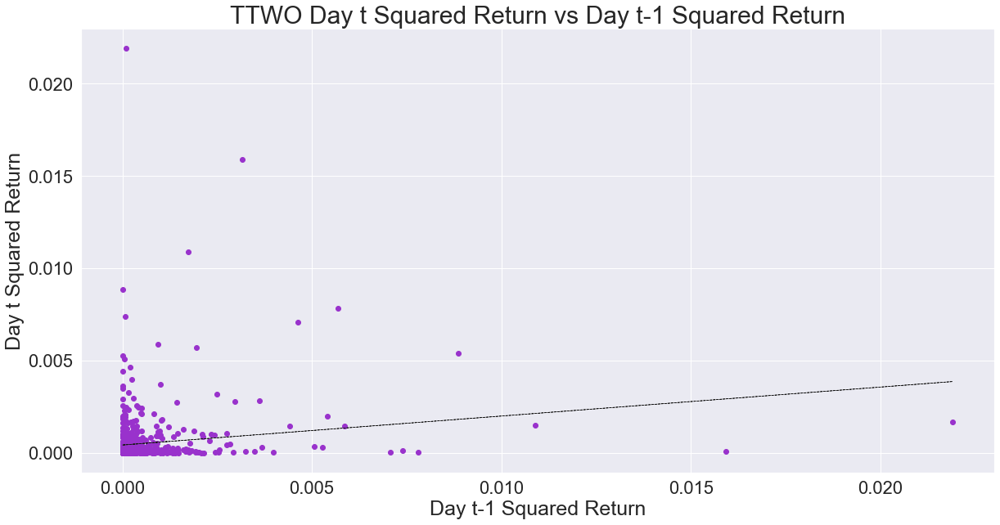

In [30]:
#TTWO
slope, intercept, r_value, p_value, std_err = stats.linregress(df_sq['TTWO'].shift(1)[1:],df_sq['TTWO'][1:])

abline_values = [slope * i + intercept for i in df_sq['TTWO'].shift(1)]

plt.figure(figsize=(20,10))
plt.scatter(df_sq['TTWO'].shift(1),df_sq['TTWO'], color = "darkorchid")
plt.title("TTWO Day t Squared Return vs Day t-1 Squared Return", fontsize = 30)
plt.ylabel("Day t Squared Return", fontsize = 25)
plt.xlabel("Day t-1 Squared Return", fontsize = 25)
plt.plot(df_sq['TTWO'].shift(1), abline_values, 'k--', linewidth = 0.75)

In [31]:
#TTWO
print("slope = ", slope)
print("intercept = ", intercept)
print("r_squared = ", r_value**2)
print("p_value = ", p_value)

slope =  0.1570098655993614
intercept =  0.00041737254725253577
r_squared =  0.024651863096276292
p_value =  1.4455956426570483e-05


Text(0.5, 0, 'Date')

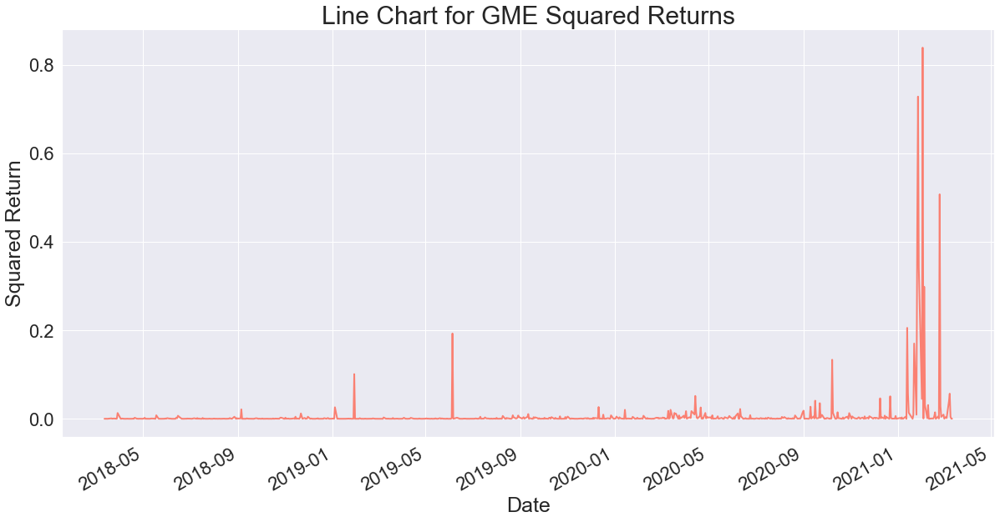

In [32]:
df_sq['GME'].plot(figsize=(20,10), linewidth = 2, color = ['salmon'])
plt.title("Line Chart for GME Squared Returns", fontsize=30)
plt.ylabel("Squared Return", fontsize = 25)
plt.xlabel("Date", fontsize = 25)

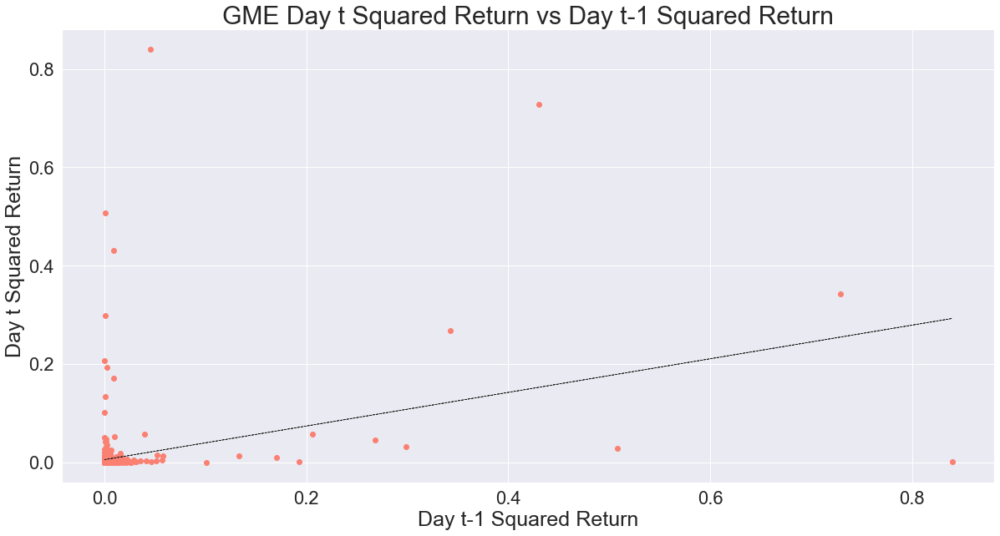

In [33]:
#TTWO
slope, intercept, r_value, p_value, std_err = stats.linregress(df_sq['GME'].shift(1)[1:],df_sq['GME'][1:])

abline_values = [slope * i + intercept for i in df_sq['GME'].shift(1)]

plt.figure(figsize=(20,10))
plt.scatter(df_sq['GME'].shift(1),df_sq['GME'], color = "salmon")
plt.title("GME Day t Squared Return vs Day t-1 Squared Return", fontsize = 30)
plt.ylabel("Day t Squared Return", fontsize = 25)
plt.xlabel("Day t-1 Squared Return", fontsize = 25)
plt.plot(df_sq['GME'].shift(1), abline_values, 'k--', linewidth = 0.75)

In [34]:
#GME
print("slope = ", slope)
print("intercept = ", intercept)
print("r_squared = ", r_value**2)
print("p_value = ", p_value)

slope =  0.3421249089697669
intercept =  0.005190498400515391
r_squared =  0.11704960254460885
p_value =  3.488850436500845e-22


Text(0.5, 0, 'Date')

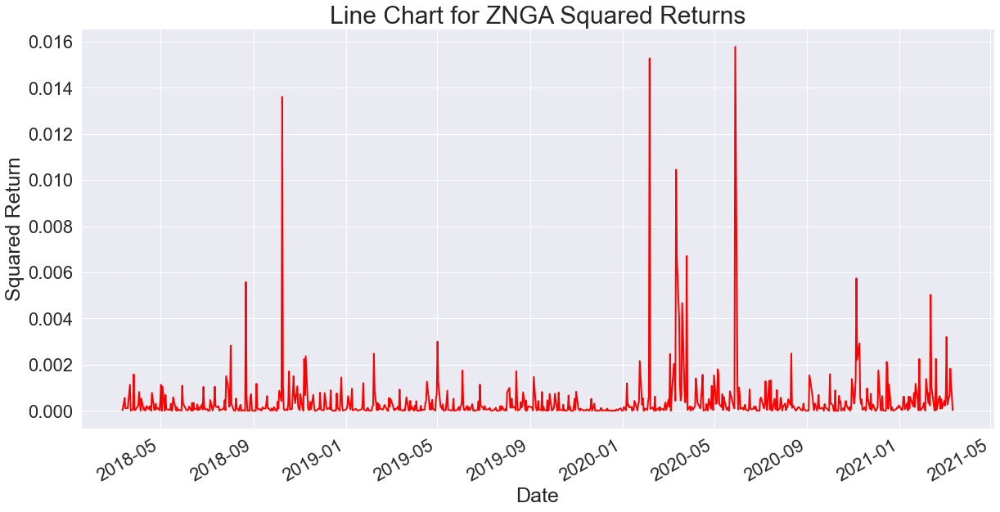

In [35]:
df_sq['ZNGA'].plot(figsize=(20,10), linewidth = 2, color = ['red'])
plt.title("Line Chart for ZNGA Squared Returns", fontsize=30)
plt.ylabel("Squared Return", fontsize = 25)
plt.xlabel("Date", fontsize = 25)

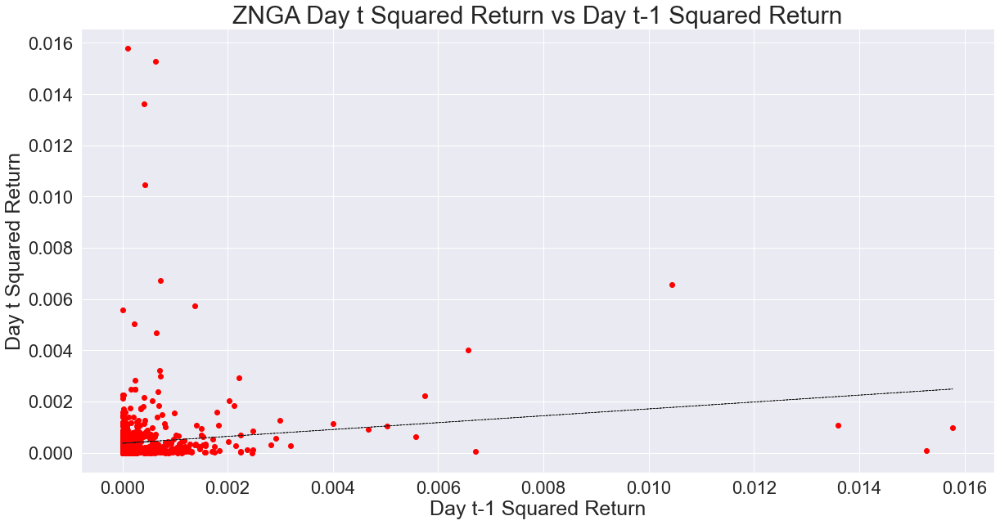

In [36]:
#TTWO
slope, intercept, r_value, p_value, std_err = stats.linregress(df_sq['ZNGA'].shift(1)[1:],df_sq['ZNGA'][1:])

abline_values = [slope * i + intercept for i in df_sq['ZNGA'].shift(1)]

plt.figure(figsize=(20,10))
plt.scatter(df_sq['ZNGA'].shift(1),df_sq['ZNGA'], color = "red")
plt.title("ZNGA Day t Squared Return vs Day t-1 Squared Return", fontsize = 30)
plt.ylabel("Day t Squared Return", fontsize = 25)
plt.xlabel("Day t-1 Squared Return", fontsize = 25)
plt.plot(df_sq['ZNGA'].shift(1), abline_values, 'k--', linewidth = 0.75)

In [37]:
#ZNGA
print("slope = ", slope)
print("intercept = ", intercept)
print("r_squared = ", r_value**2)
print("p_value = ", p_value)

slope =  0.13419125950840238
intercept =  0.0003687236455418311
r_squared =  0.018007328428239405
p_value =  0.0002153479784899844


# Ljung Box Test

In [38]:
import statsmodels.api as sm

In [39]:
sm.stats.acorr_ljungbox(df["ATVI"], 20, boxpierce = True, return_df = True)

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
1,11.724247,6.169100e-04,11.677906,6.324666e-04
2,11.814327,2.719891e-03,11.767511,2.784309e-03
3,12.889192,4.882466e-03,12.835296,5.006671e-03
4,14.938805,4.829838e-03,14.868706,4.981422e-03
5,20.362579,1.068294e-03,20.242458,1.125329e-03
6,22.315643,1.061279e-03,22.174937,1.125581e-03
7,23.243610,1.545793e-03,23.091901,1.642908e-03
8,30.927291,1.447517e-04,30.674347,1.605391e-04
9,44.897644,9.637656e-07,44.442231,1.169775e-06
10,46.259138,1.287216e-06,45.782199,1.570581e-06


In [40]:
sm.stats.acorr_ljungbox(df["TTWO"], 20, boxpierce = True, return_df = True)

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
1,19.115790,1.230228e-05,19.040234,1.279911e-05
2,19.398008,6.134455e-05,19.320965,6.375377e-05
3,19.587088,2.066918e-04,19.508799,2.145515e-04
4,20.086877,4.800588e-04,20.004636,4.983478e-04
5,26.966085,5.791650e-05,26.820400,6.182446e-05
6,27.021549,1.434677e-04,26.875279,1.528087e-04
7,29.646084,1.102527e-04,29.468694,1.188075e-04
8,41.645503,1.578271e-06,41.310018,1.823988e-06
9,56.424626,6.511526e-09,55.874950,8.293145e-09
10,56.450639,1.690087e-08,55.900552,2.142864e-08


In [41]:
sm.stats.acorr_ljungbox(df["GME"], 20, boxpierce = True, return_df = True)

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
1,0.002544,9.597694e-01,0.002534,9.598489e-01
2,9.642515,8.056649e-03,9.591701,8.263966e-03
3,41.911736,4.188942e-09,41.648346,4.764214e-09
4,93.058228,2.948644e-19,92.390517,4.088392e-19
5,94.239862,8.629687e-19,93.561254,1.198793e-18
6,100.977691,1.568675e-19,100.228065,2.248893e-19
7,110.122814,8.659227e-21,109.264747,1.304575e-20
8,120.851321,2.211650e-22,119.851903,3.557134e-22
9,121.341053,7.100030e-22,120.334538,1.141236e-21
10,122.410604,1.639310e-21,121.387179,2.645801e-21


In [42]:
sm.stats.acorr_ljungbox(df["ZNGA"], 20, boxpierce = True, return_df = True)

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
1,2.987623,0.083903,2.975814,0.084518
2,3.015914,0.221362,3.003956,0.222689
3,5.004242,0.171487,4.979186,0.173328
4,5.004655,0.286820,4.979596,0.289398
5,8.031026,0.154534,7.978055,0.157449
6,8.781226,0.186261,8.720348,0.189927
7,13.789862,0.055048,13.669594,0.057380
8,18.189941,0.019847,18.011700,0.021139
9,19.964634,0.018132,19.760673,0.019448
10,20.782549,0.022662,20.565656,0.024334


# Ljung Box Test: Squared Returns

In [43]:
sm.stats.acorr_ljungbox(df_sq["ATVI"], 20, boxpierce = True, return_df = True)

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
1,6.972637,8.276545e-03,6.945077,8.405023e-03
2,12.636423,1.803166e-03,12.579014,1.855674e-03
3,16.300118,9.841179e-04,16.218575,1.022773e-03
4,27.059228,1.933826e-05,26.892633,2.089759e-05
5,42.523471,4.615001e-08,42.214254,5.330672e-08
6,46.891209,1.966985e-08,46.535955,2.315366e-08
7,51.133857,8.647040e-09,50.728295,1.039042e-08
8,55.138821,4.148969e-09,54.680493,5.093293e-09
9,60.565808,1.042876e-09,60.028827,1.323638e-09
10,62.108174,1.443249e-09,61.546808,1.845054e-09


In [44]:
sm.stats.acorr_ljungbox(df_sq["TTWO"], 20, boxpierce = True, return_df = True)

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
1,18.729510,1.506332e-05,18.655480,1.565965e-05
2,23.360132,8.460809e-06,23.261698,8.887640e-06
3,35.349609,1.027696e-07,35.172193,1.120352e-07
4,49.243544,5.194090e-10,48.956295,5.962708e-10
5,50.073015,1.338931e-09,49.778116,1.538500e-09
6,52.459961,1.507004e-09,52.139903,1.747838e-09
7,53.372702,3.129151e-09,53.041822,3.637325e-09
8,54.392637,5.792809e-09,54.048318,6.756137e-09
9,56.133015,7.403259e-09,55.763474,8.709730e-09
10,66.129784,2.462900e-10,65.602190,3.108454e-10


In [45]:
sm.stats.acorr_ljungbox(df_sq["GME"], 20, boxpierce = True, return_df = True)

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
1,88.953145,4.042753e-21,88.601552,4.829102e-21
2,225.832029,9.145301e-50,224.759071,1.563824e-49
3,284.982267,1.769099e-61,283.519650,3.666449e-61
4,384.992310,4.860204e-82,382.739100,1.490722e-81
5,434.071916,1.338568e-91,431.366061,5.130439e-91
6,445.503483,4.556794e-93,442.677137,1.848798e-92
7,461.778848,1.311108e-95,458.759514,5.836966e-95
8,466.013035,1.368081e-95,462.937914,6.241327e-95
9,476.510183,6.131007e-97,473.282930,3.006318e-96
10,478.161146,2.041215e-96,474.907791,1.010499e-95


In [46]:
sm.stats.acorr_ljungbox(df_sq["ZNGA"], 20, boxpierce = True, return_df = True)

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
1,13.681638,0.000217,13.627560,0.000223
2,16.811111,0.000224,16.740541,0.000232
3,18.444840,0.000356,18.363507,0.000370
4,23.515870,0.000100,23.394450,0.000106
5,23.661567,0.000252,23.538804,0.000266
6,24.297261,0.000460,24.167798,0.000486
7,24.646686,0.000876,24.513078,0.000925
8,24.888257,0.001624,24.751467,0.001713
9,28.636800,0.000746,28.445683,0.000803
10,31.169033,0.000550,30.937881,0.000601


# ACF Plots: Returns

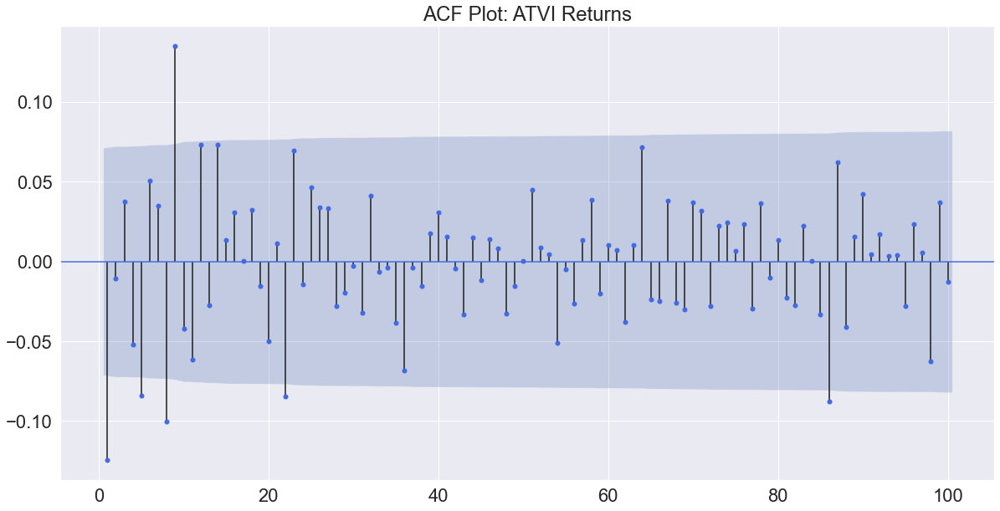

In [47]:
fig, ax = plt.subplots(figsize=(20, 10))
sm.graphics.tsa.plot_acf(df["ATVI"], lags=100, color = "royalblue", ax = ax, title='ACF Plot: ATVI Returns', zero=False)
plt.figsize=(20,10)

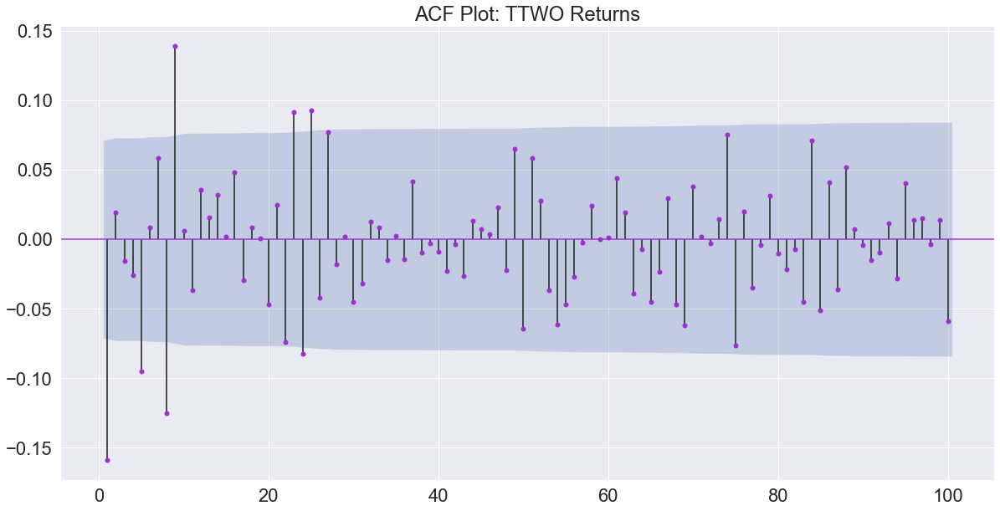

In [48]:
fig, ax = plt.subplots(figsize=(20, 10))
sm.graphics.tsa.plot_acf(df["TTWO"], lags=100, color = "darkorchid", ax = ax, title='ACF Plot: TTWO Returns',zero=False)
plt.figsize=(20,10)

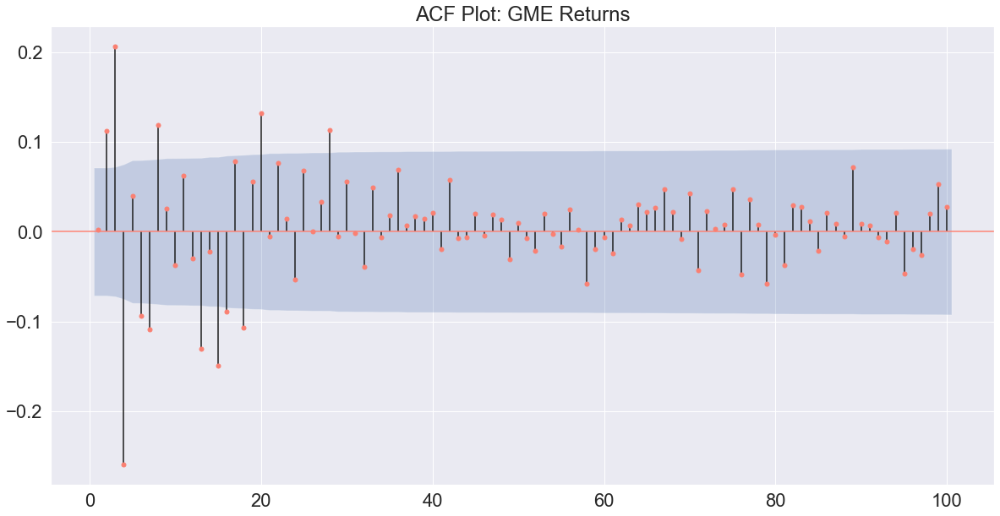

In [49]:
fig, ax = plt.subplots(figsize=(20, 10))
sm.graphics.tsa.plot_acf(df["GME"], lags=100, color = "salmon", ax = ax, title='ACF Plot: GME Returns', zero=False)
plt.figsize=(20,10)

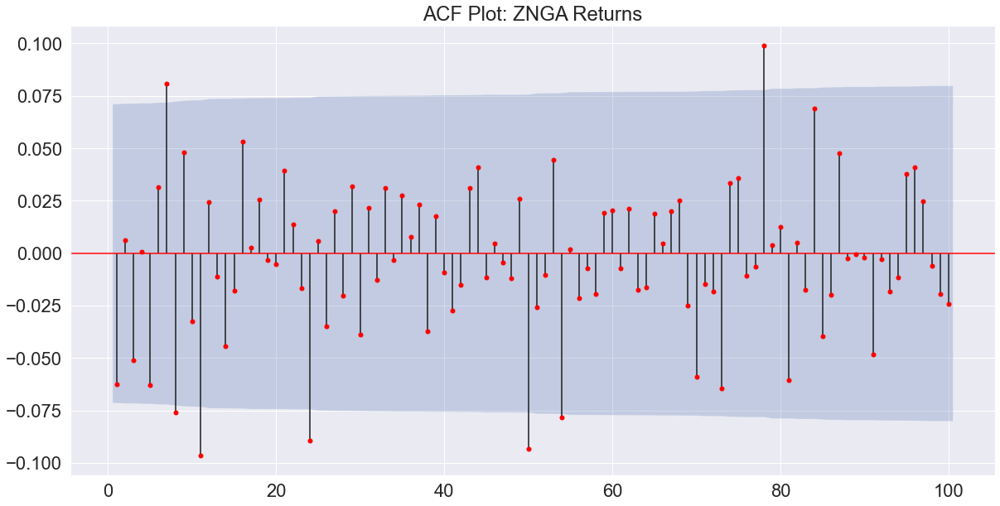

In [50]:
fig, ax = plt.subplots(figsize=(20, 10))
sm.graphics.tsa.plot_acf(df["ZNGA"], lags=100, color = "red", ax = ax, title='ACF Plot: ZNGA Returns', zero=False)
plt.figsize=(20,10)

# ACF Plots: Squared Returns

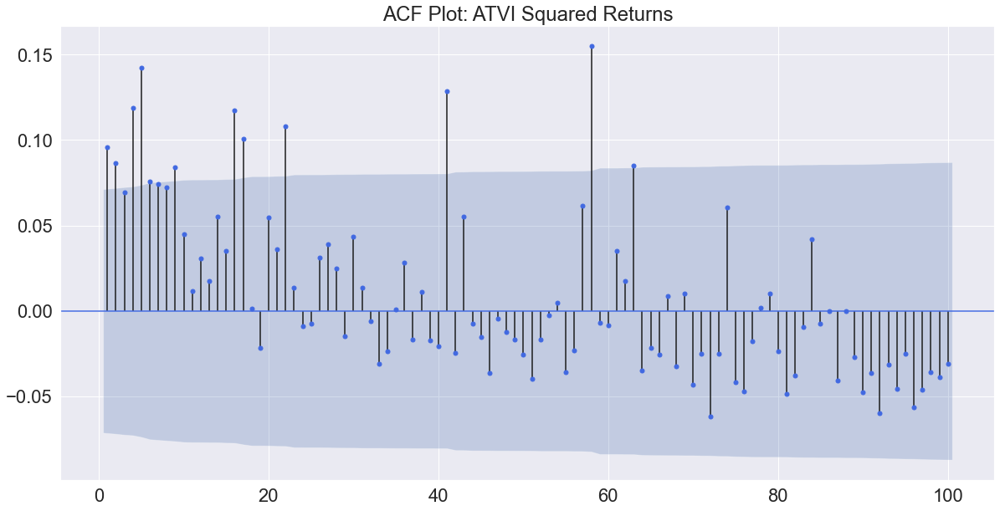

In [51]:
fig, ax = plt.subplots(figsize=(20, 10))
sm.graphics.tsa.plot_acf(df_sq["ATVI"], lags=100, color = "royalblue", ax = ax, title='ACF Plot: ATVI Squared Returns', zero=False)
plt.figsize=(20,10)

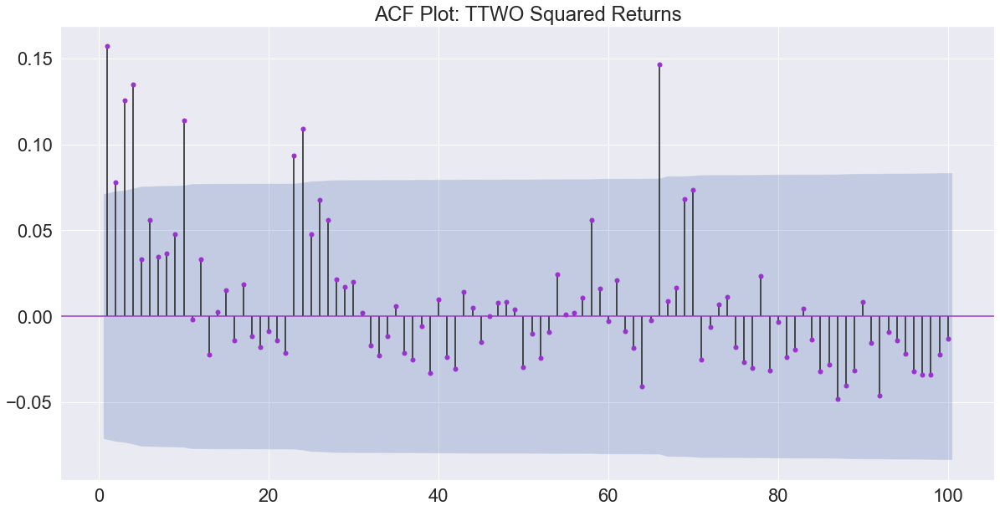

In [52]:
fig, ax = plt.subplots(figsize=(20, 10))
sm.graphics.tsa.plot_acf(df_sq["TTWO"], lags=100, color = "darkorchid", ax = ax, title='ACF Plot: TTWO Squared Returns', zero=False)
plt.figsize=(20,10)

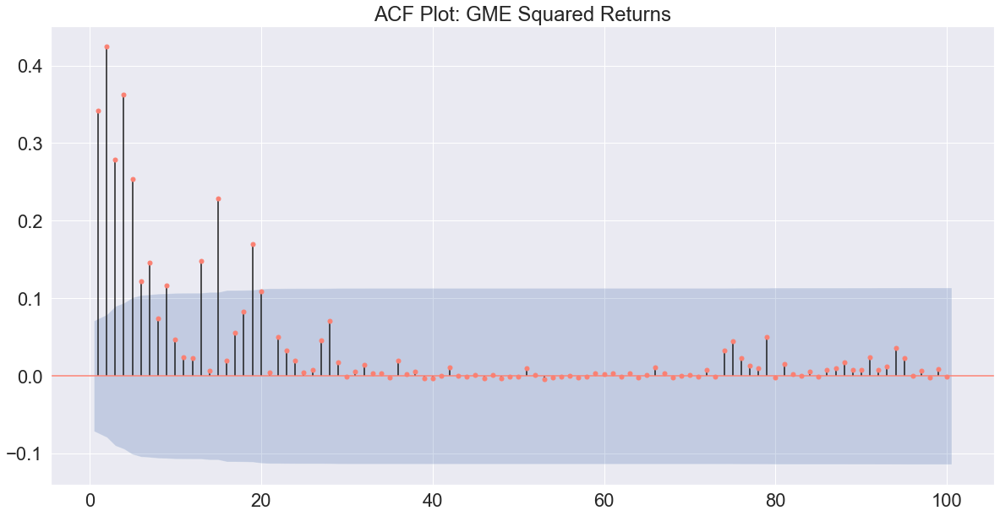

In [53]:
fig, ax = plt.subplots(figsize=(20, 10))
sm.graphics.tsa.plot_acf(df_sq["GME"], lags=100, color = "salmon", ax = ax, title='ACF Plot: GME Squared Returns', zero=False)
plt.figsize=(20,10)

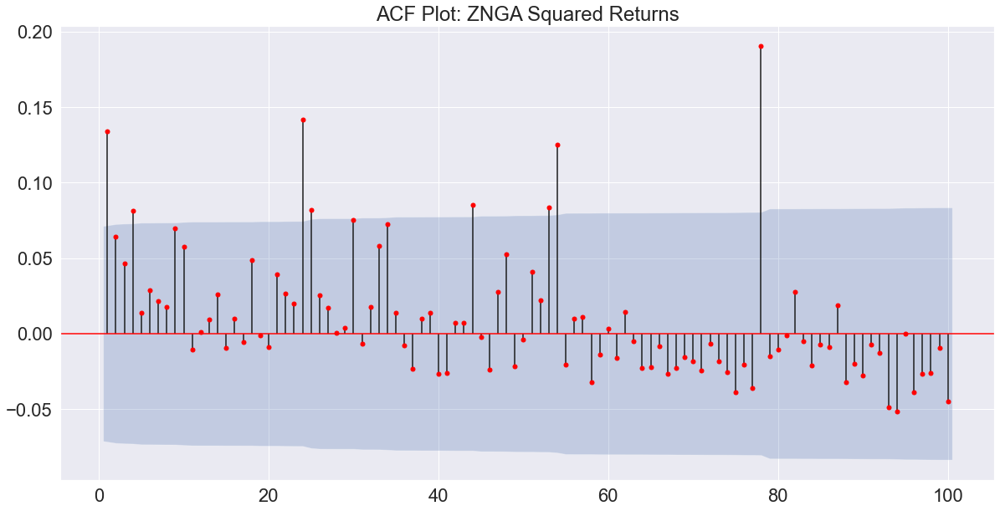

In [54]:
fig, ax = plt.subplots(figsize=(20, 10))
sm.graphics.tsa.plot_acf(df_sq["ZNGA"], lags=100, color = "red", ax = ax, title='ACF Plot: ZNGA Squared Returns', zero=False)
plt.figsize=(20,10)

# The standard deviation of returns completely dominates the mean of returns at short horizons; it is impossible to reject statistically zero mean

In [55]:
ATVIh = pd.read_csv("Horizon Analysis/ATVI Horizon.csv",index_col='Date', parse_dates=True, dayfirst=True)
ATVIh.head()

,1D,5D,10D,15D,20D,25D
Date,,,,,,
2018-03-09,NaN,NaN,NaN,NaN,NaN,NaN
2018-03-12,-0.010127,NaN,NaN,NaN,NaN,NaN
2018-03-13,-0.012174,NaN,NaN,NaN,NaN,NaN
2018-03-14,-0.022778,NaN,NaN,NaN,NaN,NaN
2018-03-15,-0.011382,NaN,NaN,NaN,NaN,NaN


In [56]:
ATVIh.mean()

1D     0.000484
5D     0.000459
10D    0.000677
15D    0.000916
20D    0.001432
25D    0.001147
dtype: float64

In [57]:
ATVIh.std()

1D     0.021464
5D     0.017110
10D    0.018551
15D    0.019091
20D    0.018821
25D    0.017613
dtype: float64

In [58]:
ATVIh.mean()/ATVIh.std()

1D     0.022540
5D     0.026800
10D    0.036513
15D    0.048003
20D    0.076105
25D    0.065121
dtype: float64

In [59]:
ATVIh.skew()

1D    -0.501227
5D    -0.373098
10D   -0.429100
15D   -1.070098
20D   -1.177339
25D   -1.104746
dtype: float64

In [60]:
ATVIh.kurt()

1D     4.579543
5D     1.035348
10D    0.386235
15D    2.704632
20D    2.856405
25D    2.511845
dtype: float64

In [61]:
TTWOh = pd.read_csv("Horizon Analysis/TTWO Horizon.csv",index_col='Date', parse_dates=True, dayfirst=True)
TTWOh.head()

,1D,5D,10D,15D,20D,25D
Date,,,,,,
2018-03-09,NaN,NaN,NaN,NaN,NaN,NaN
2018-03-12,-0.004324,NaN,NaN,NaN,NaN,NaN
2018-03-13,-0.019632,NaN,NaN,NaN,NaN,NaN
2018-03-14,-0.038259,NaN,NaN,NaN,NaN,NaN
2018-03-15,-0.003026,NaN,NaN,NaN,NaN,NaN


In [62]:
TTWOh.mean()

1D     0.000727
5D     0.000935
10D    0.001541
15D    0.001988
20D    0.002677
25D    0.002441
dtype: float64

In [63]:
TTWOh.std()

1D     0.022240
5D     0.016174
10D    0.016108
15D    0.017241
20D    0.016439
25D    0.016259
dtype: float64

In [64]:
TTWOh.mean()/ATVIh.std()

1D     0.033894
5D     0.054627
10D    0.083089
15D    0.104138
20D    0.142242
25D    0.138610
dtype: float64

In [65]:
TTWOh.skew()

1D    -0.563923
5D    -0.146820
10D   -0.362759
15D   -0.736790
20D   -0.065137
25D   -0.259765
dtype: float64

In [66]:
TTWOh.kurt()

1D     5.941578
5D     0.256971
10D    0.030440
15D    0.722660
20D    0.115033
25D   -0.463070
dtype: float64

In [67]:
GMEh = pd.read_csv("Horizon Analysis/GME Horizon.csv",index_col='Date', parse_dates=True, dayfirst=True)
GMEh.head()

,1D,5D,10D,15D,20D,25D
Date,,,,,,
2018-03-09,NaN,NaN,NaN,NaN,NaN,NaN
2018-03-12,-0.011033,NaN,NaN,NaN,NaN,NaN
2018-03-13,0.003851,NaN,NaN,NaN,NaN,NaN
2018-03-14,-0.009656,NaN,NaN,NaN,NaN,NaN
2018-03-15,-0.009750,NaN,NaN,NaN,NaN,NaN


In [68]:
GMEh.mean()

1D     0.002960
5D     0.007254
10D    0.007496
15D    0.009179
20D    0.005713
25D    0.011613
dtype: float64

In [69]:
GMEh.std()

1D     0.088775
5D     0.074373
10D    0.067507
15D    0.052925
20D    0.056136
25D    0.075098
dtype: float64

In [70]:
GMEh.mean()/ATVIh.std()

1D     0.137911
5D     0.423961
10D    0.404042
15D    0.480812
20D    0.303546
25D    0.659314
dtype: float64

In [71]:
GMEh.skew()

1D     0.702402
5D     2.440694
10D    1.350518
15D    1.008788
20D    1.195678
25D    3.778103
dtype: float64

In [72]:
GMEh.kurt()

1D     42.585507
5D     15.002822
10D     4.283197
15D     1.916998
20D     1.558343
25D    17.421869
dtype: float64

In [73]:
ZNGAh = pd.read_csv("Horizon Analysis/ZNGA Horizon.csv",index_col='Date', parse_dates=True, dayfirst=True)
ZNGAh.head()

,1D,5D,10D,15D,20D,25D
Date,,,,,,
2018-03-09,NaN,NaN,NaN,NaN,NaN,NaN
2018-03-12,0.004637,NaN,NaN,NaN,NaN,NaN
2018-03-13,-0.013423,NaN,NaN,NaN,NaN,NaN
2018-03-14,0.018742,NaN,NaN,NaN,NaN,NaN
2018-03-15,0.023592,NaN,NaN,NaN,NaN,NaN


In [74]:
ZNGAh.mean()

1D     0.001570
5D     0.002369
10D    0.003697
15D    0.004644
20D    0.005577
25D    0.005985
dtype: float64

In [75]:
ZNGAh.std()

1D     0.020577
5D     0.018846
10D    0.019116
15D    0.016729
20D    0.018233
25D    0.016699
dtype: float64

In [76]:
ZNGAh.mean()/ATVIh.std()

1D     0.073157
5D     0.138467
10D    0.199282
15D    0.243279
20D    0.296307
25D    0.339799
dtype: float64

In [77]:
ZNGAh.skew()

1D     0.638577
5D    -0.761782
10D   -0.237506
15D   -0.257334
20D    0.517240
25D   -0.313744
dtype: float64

In [78]:
ZNGAh.kurt()

1D     5.943115
5D     2.860740
10D    0.974513
15D   -0.535778
20D   -0.101633
25D   -0.351036
dtype: float64

# EMWA Volatility

In [79]:
def emwa(R, l):
    emwa_vol = pd.DataFrame(index = R.index, columns = R.columns)
    emwa_vol.iloc[0,:] = R.std()
    for i in range(1, len(R)):
        emwa_vol.iloc[i,:] = (l*(emwa_vol.iloc[i-1,:]).pow(2) + (1-l)*(R.iloc[i-1,:]).pow(2)).pow(1/2)
    return emwa_vol

In [80]:
#lambda of 0.94 is generally used
df_emwa = emwa(df, 0.94)

Text(0.5, 0, 'Date')

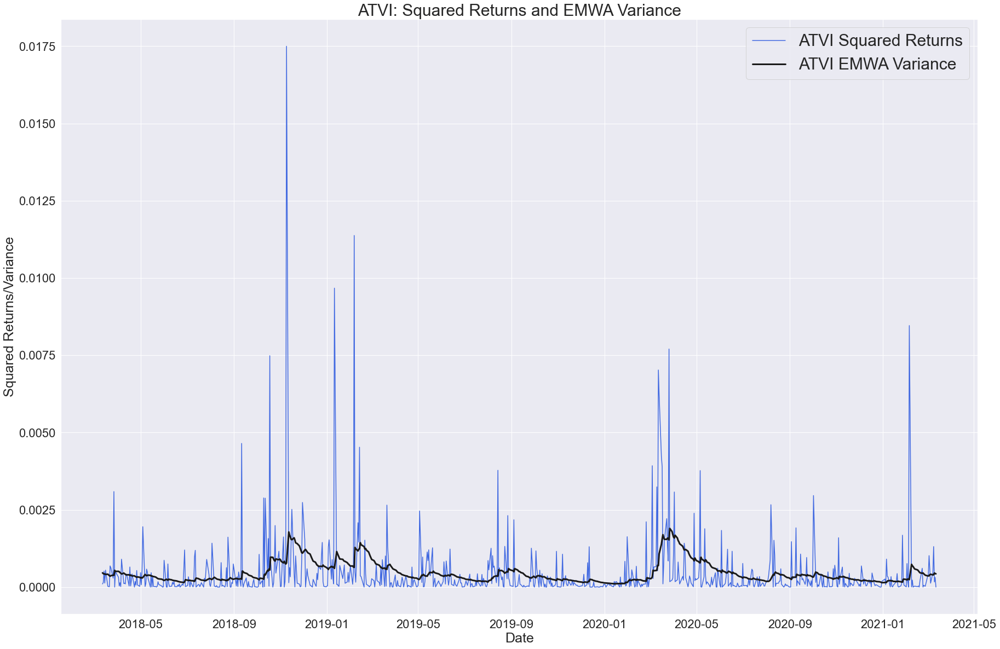

In [81]:
plt.figure(figsize=(30,20))
plt.plot(df_sq["ATVI"], color = "royalblue")
plt.plot(df_emwa["ATVI"].pow(2), color = "k", linewidth = 3)
plt.legend(["ATVI Squared Returns","ATVI EMWA Variance"], prop={'size': 30})
plt.title("ATVI: Squared Returns and EMWA Variance", fontsize = 30)
plt.ylabel("Squared Returns/Variance", fontsize = 25)
plt.xlabel("Date", fontsize = 25)

Text(0.5, 0, 'Date')

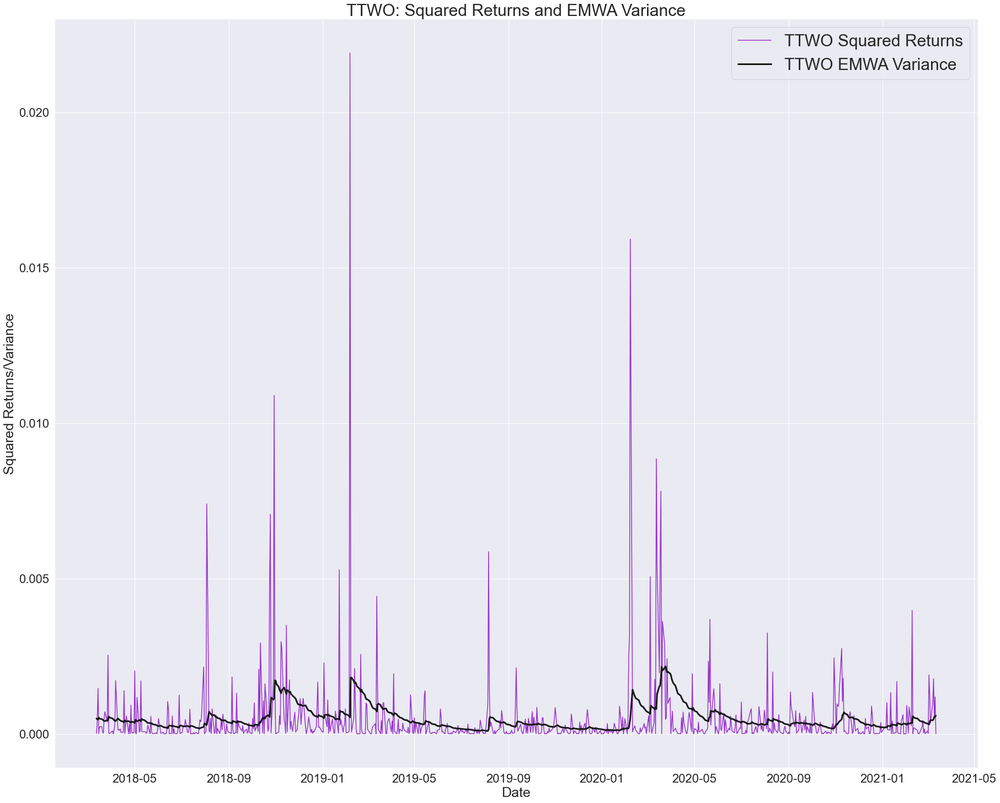

In [82]:
plt.figure(figsize=(30,25))
plt.plot(df_sq["TTWO"], color = "darkorchid")
plt.plot(df_emwa["TTWO"].pow(2), color = "k", linewidth = 3)
plt.legend(["TTWO Squared Returns","TTWO EMWA Variance"], prop={'size': 30})
plt.title("TTWO: Squared Returns and EMWA Variance", fontsize = 30)
plt.ylabel("Squared Returns/Variance", fontsize = 25)
plt.xlabel("Date", fontsize = 25)

Text(0.5, 0, 'Date')

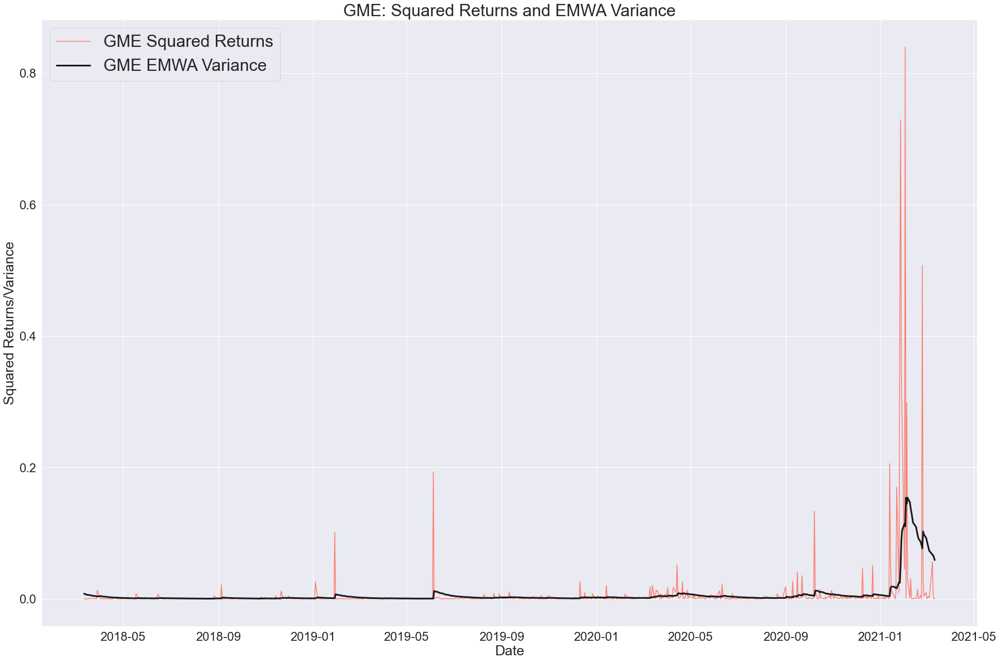

In [83]:
plt.figure(figsize=(30,20))
plt.plot(df_sq["GME"], color = "salmon")
plt.plot(df_emwa["GME"].pow(2), color = "k", linewidth = 3)
plt.legend(["GME Squared Returns","GME EMWA Variance"], prop={'size': 30})
plt.title("GME: Squared Returns and EMWA Variance", fontsize = 30)
plt.ylabel("Squared Returns/Variance", fontsize = 25)
plt.xlabel("Date", fontsize = 25)

Text(0.5, 0, 'Date')

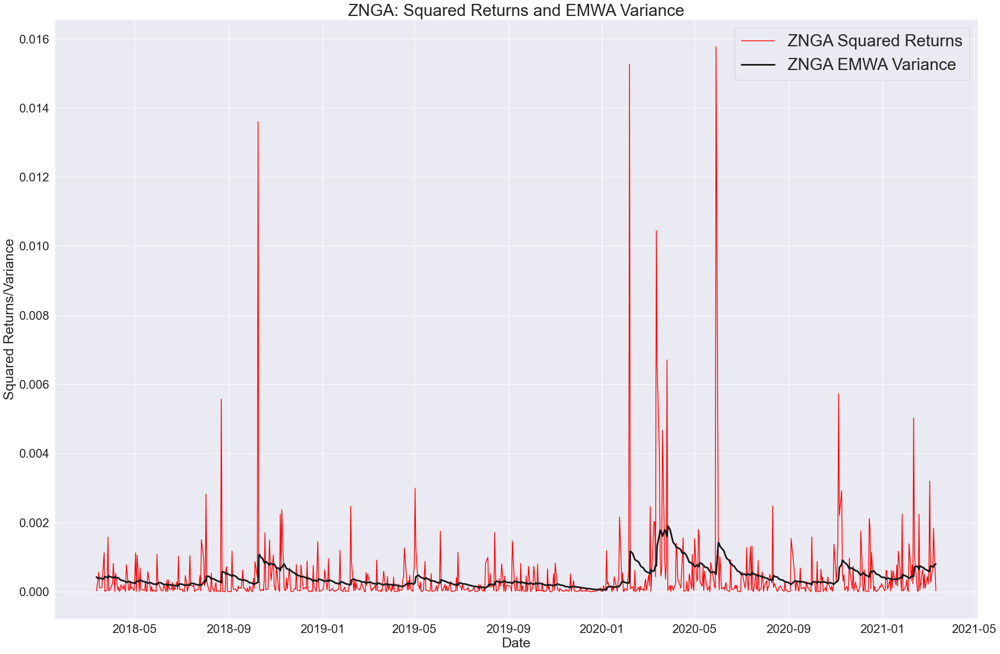

In [84]:
plt.figure(figsize=(30,20))
plt.plot(df_sq["ZNGA"], color = "red")
plt.plot(df_emwa["ZNGA"].pow(2), color = "k", linewidth = 3)
plt.legend(["ZNGA Squared Returns","ZNGA EMWA Variance"], prop={'size': 30})
plt.title("ZNGA: Squared Returns and EMWA Variance", fontsize = 30)
plt.ylabel("Squared Returns/Variance", fontsize = 25)
plt.xlabel("Date", fontsize = 25)

# The Leverage Effect

In [85]:
from scipy.stats.stats import pearsonr   
n = 100

lcorr = pd.DataFrame(index = list(range(1,n+1)), columns = df.columns)

for i in range(1, n+1):
    for j in range(len(lcorr.columns)):
        lcorr.iloc[i-1,j] =  pearsonr(df_sq.iloc[i:,j].values, df.iloc[0:(len(df)-i),j].values)[0]

In [86]:
lcorr

,ATVI,TTWO,GME,ZNGA
1,-0.0602962,-0.0293743,0.162056,-0.0844006
2,0.00374977,-0.0178375,0.253661,-3.4694e-05
3,-0.00991262,0.0351054,0.00476417,-0.0232419
4,-0.0379642,-0.100476,0.292744,-0.0417836
5,-0.0226021,-0.0214785,0.154348,-0.0037548
...,...,...,...,...
96,0.0397679,0.000766766,-0.0379091,-0.00114543
97,-0.0130081,0.0175919,0.0394973,0.0213376
98,-0.00263483,-0.0331699,-0.0079014,0.0182357
99,0.0186803,0.0245768,-0.039834,0.0167534


<ipython-input-209-8e3a6ec7c35f>:2: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = plt.stem(np.arange(1,101), lcorr['ATVI'], linefmt = "k")


Text(0, 0.5, 'Correlation')

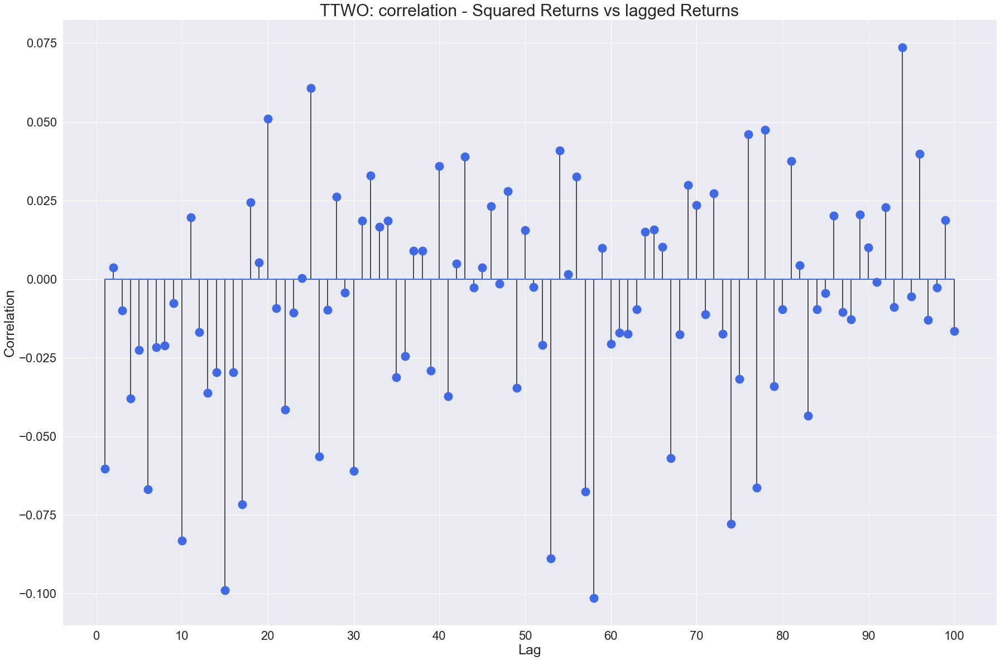

In [209]:
plt.figure(figsize=(30,20))
markerline, stemlines, baseline = plt.stem(np.arange(1,101), lcorr['ATVI'], linefmt = "k")
plt.setp(baseline, color='royalblue', linewidth=2)
plt.setp(markerline, color = 'royalblue', markersize = 15)
plt.title("TTWO: correlation - Squared Returns vs lagged Returns", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)

<ipython-input-206-cbd795931ec3>:2: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = plt.stem(np.arange(1,101), lcorr['TTWO'], linefmt = "k")


Text(0, 0.5, 'Correlation')

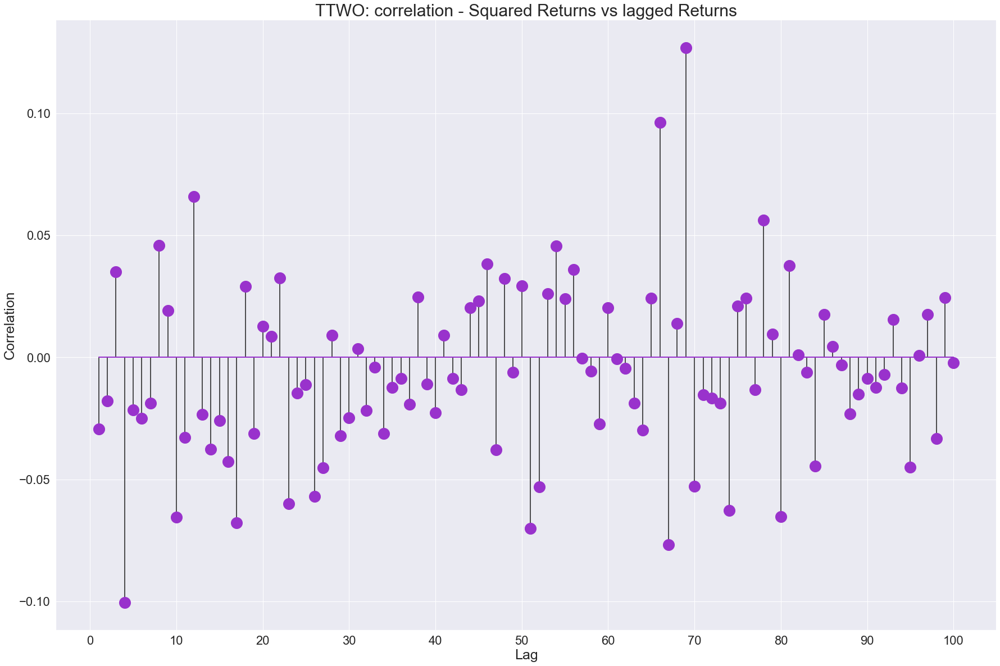

In [206]:
plt.figure(figsize=(30,20))
markerline, stemlines, baseline = plt.stem(np.arange(1,101), lcorr['TTWO'], linefmt = "k")
plt.setp(baseline, color='darkorchid', linewidth=2)
plt.setp(markerline, color = 'darkorchid', markersize = 15)
plt.title("TTWO: correlation - Squared Returns vs lagged Returns", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)

<ipython-input-208-75bb5771ef8d>:2: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = plt.stem(np.arange(1,101), lcorr['GME'], linefmt = "k")


Text(0, 0.5, 'Correlation')

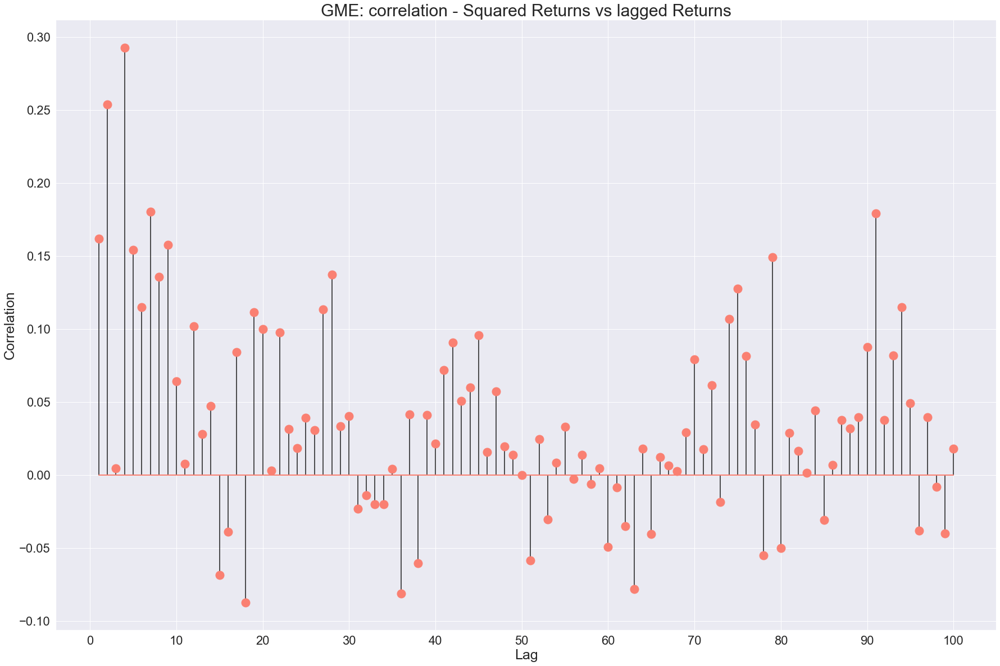

In [208]:
plt.figure(figsize=(30,20))
markerline, stemlines, baseline = plt.stem(np.arange(1,101), lcorr['GME'], linefmt = "k")
plt.setp(baseline, color='salmon', linewidth=2)
plt.setp(markerline, color = 'salmon', markersize = 15)
plt.title("GME: correlation - Squared Returns vs lagged Returns", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)

<ipython-input-207-fe3c8d628f7f>:2: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = plt.stem(np.arange(1,101), lcorr['ZNGA'], linefmt = "k")


Text(0, 0.5, 'Correlation')

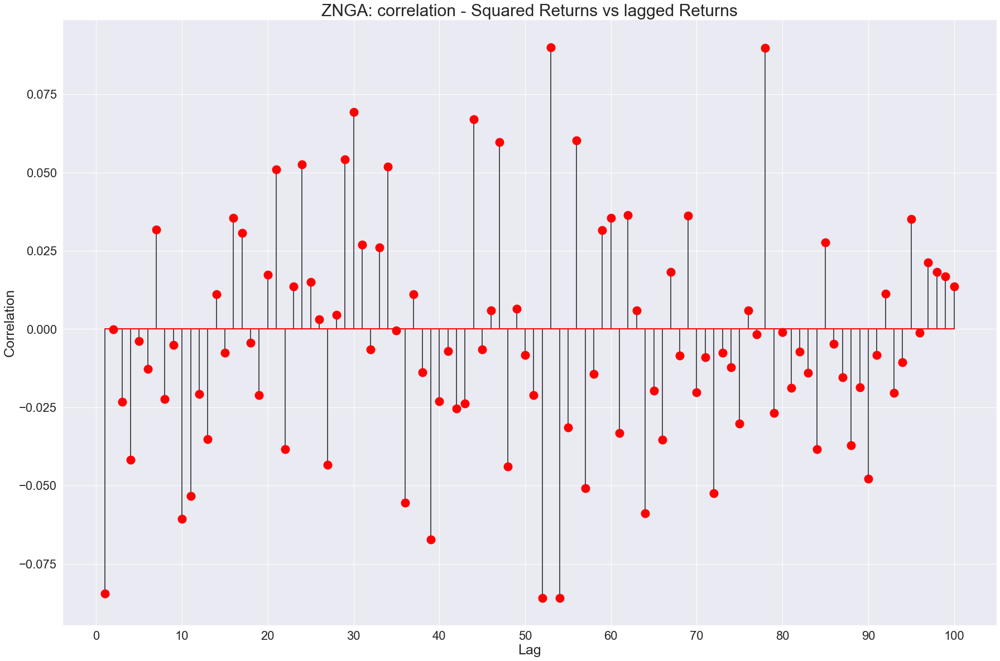

In [207]:
plt.figure(figsize=(30,20))
markerline, stemlines, baseline = plt.stem(np.arange(1,101), lcorr['ZNGA'], linefmt = "k")
plt.setp(baseline, color='red', linewidth=2)
plt.setp(markerline, color = 'red', markersize = 15)
plt.title("ZNGA: correlation - Squared Returns vs lagged Returns", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)

In [91]:
ind = pd.read_csv("Indices.csv",index_col='Date', parse_dates=True, dayfirst=True)
ind.head()

,S&P500,NASDAQ,DJIA,Russell2000
Date,,,,
2018-03-12,-0.000736,0.002097,-0.003592,0.001415
2018-03-13,-0.006384,-0.010240,-0.006838,-0.005643
2018-03-14,-0.005741,-0.001892,-0.010003,-0.004874
2018-03-15,-0.000782,-0.002012,0.004656,-0.004866
2018-03-16,0.001702,0.000033,0.002925,0.005963


In [92]:
indcorr = pd.DataFrame(index = list(range(1,n+1)), columns = ind.columns)

for i in range(1, n+1):
    for j in range(len(indcorr.columns)):
        indcorr.iloc[i-1,j] =  pearsonr(ind.iloc[i:,j].pow(2), ind.iloc[0:(len(ind)-i),j].values)[0]

In [93]:
indcorr.head()

,S&P500,NASDAQ,DJIA,Russell2000
1,-0.175987,-0.154668,-0.138513,-0.0867125
2,-0.121962,-0.103991,-0.16362,-0.171852
3,-0.0797114,-0.0881729,-0.0488948,-0.0468296
4,-0.223251,-0.179834,-0.233248,-0.234139
5,-0.0122023,-0.0323077,-0.0130409,-0.124108


<ipython-input-210-9901985e0271>:2: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = plt.stem(np.arange(1,101), indcorr['S&P500'], linefmt = "k")


Text(0, 0.5, 'Correlation')

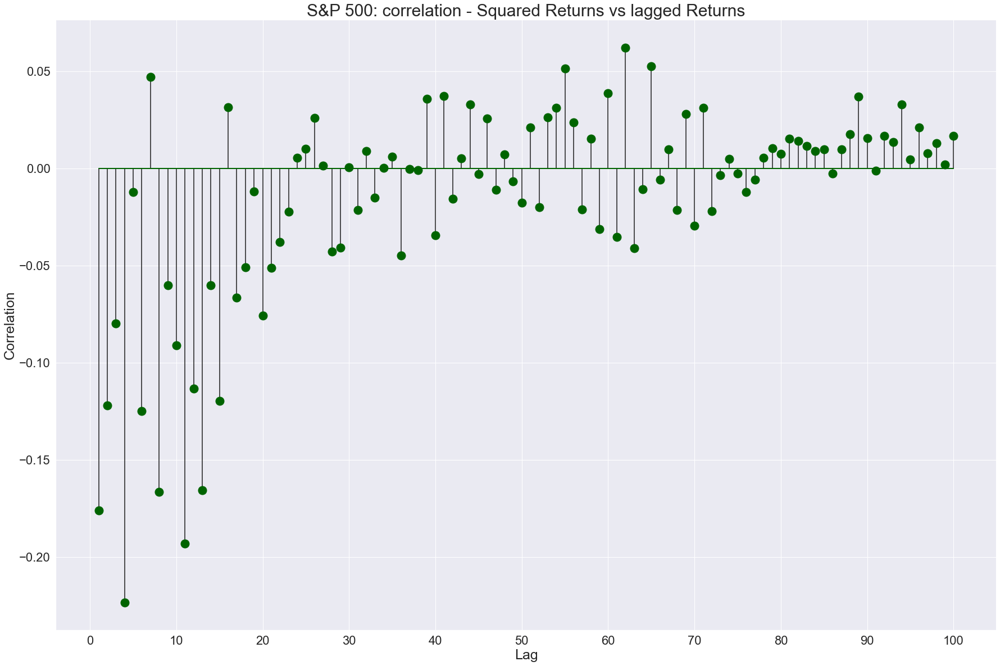

In [210]:
plt.figure(figsize=(30,20))
markerline, stemlines, baseline = plt.stem(np.arange(1,101), indcorr['S&P500'], linefmt = "k")
plt.setp(baseline, color='darkgreen', linewidth=2)
plt.setp(markerline, color = 'darkgreen', markersize = 15)
plt.title("S&P 500: correlation - Squared Returns vs lagged Returns", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)

<ipython-input-211-2e30b34a4b32>:2: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = plt.stem(np.arange(1,101), indcorr['NASDAQ'], linefmt = "k")


Text(0, 0.5, 'Correlation')

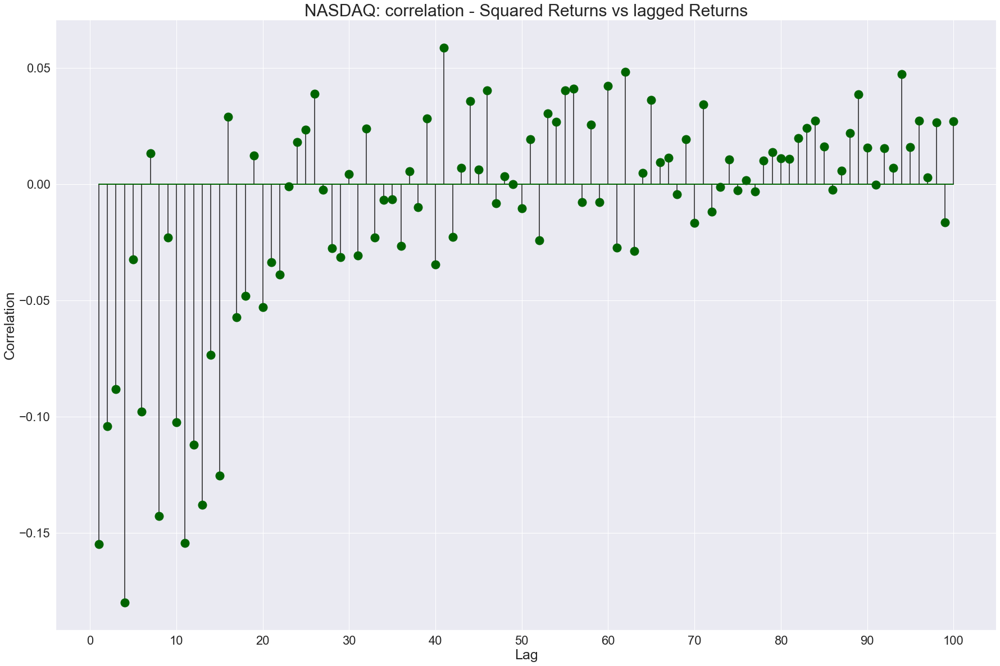

In [211]:
plt.figure(figsize=(30,20))
markerline, stemlines, baseline = plt.stem(np.arange(1,101), indcorr['NASDAQ'], linefmt = "k")
plt.setp(baseline, color='darkgreen', linewidth=2)
plt.setp(markerline, color = 'darkgreen', markersize = 15)
plt.title("NASDAQ: correlation - Squared Returns vs lagged Returns", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)

<ipython-input-212-013c8e7fb696>:2: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = plt.stem(np.arange(1,101), indcorr['DJIA'], linefmt = "k")


Text(0, 0.5, 'Correlation')

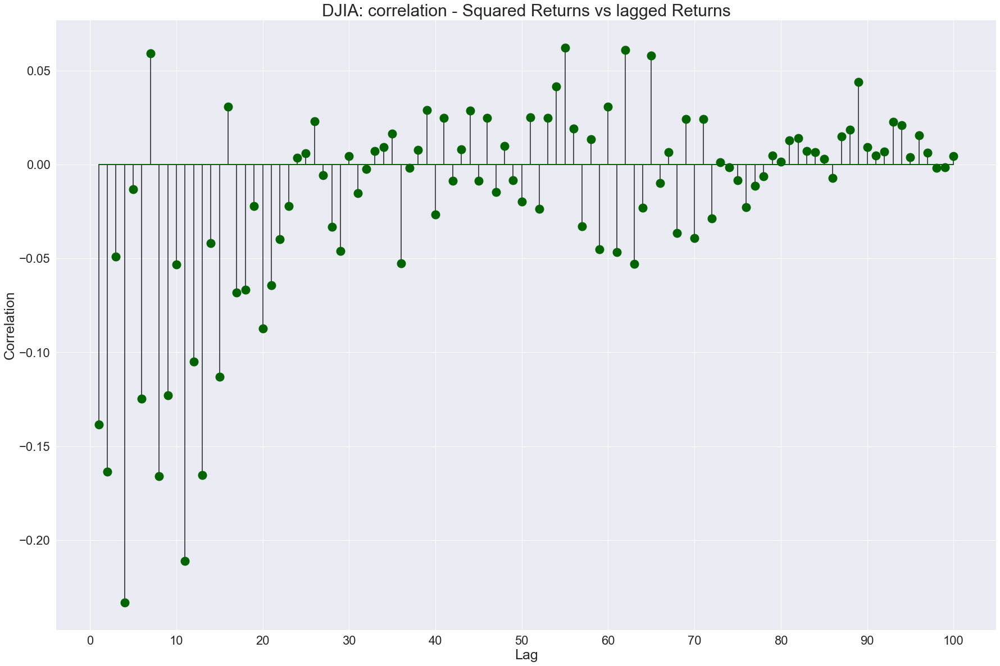

In [212]:
plt.figure(figsize=(30,20))
markerline, stemlines, baseline = plt.stem(np.arange(1,101), indcorr['DJIA'], linefmt = "k")
plt.setp(baseline, color='darkgreen', linewidth=2)
plt.setp(markerline, color = 'darkgreen', markersize = 15)
plt.title("DJIA: correlation - Squared Returns vs lagged Returns", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)

<ipython-input-213-5d58fccb4cc6>:2: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = plt.stem(np.arange(1,101), indcorr['Russell2000'], linefmt = "k")


Text(0, 0.5, 'Correlation')

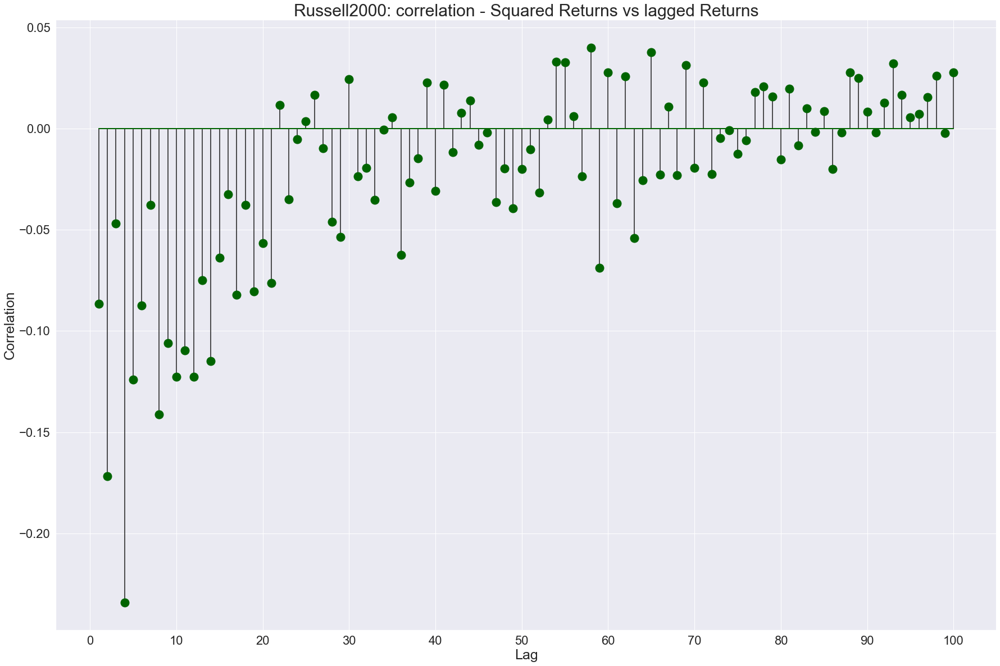

In [213]:
plt.figure(figsize=(30,20))
markerline, stemlines, baseline = plt.stem(np.arange(1,101), indcorr['Russell2000'], linefmt = "k")
plt.setp(baseline, color='darkgreen', linewidth=2)
plt.setp(markerline, color = 'darkgreen', markersize = 15)
plt.title("Russell2000: correlation - Squared Returns vs lagged Returns", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)

# Leptokurtic

In [98]:
#Calculate kurtosis
kurto = pd.DataFrame([stats.kurtosis(df[columns].values) for columns in df.columns], index = df.columns, columns = ['Kurtosis'])

In [99]:
kurto

,Kurtosis
ATVI,4.541480
TTWO,5.894463
GME,42.296833
ZNGA,5.896018


In [100]:
df.kurt()

ATVI     4.579588
TTWO     5.941550
GME     42.585507
ZNGA     5.943115
dtype: float64

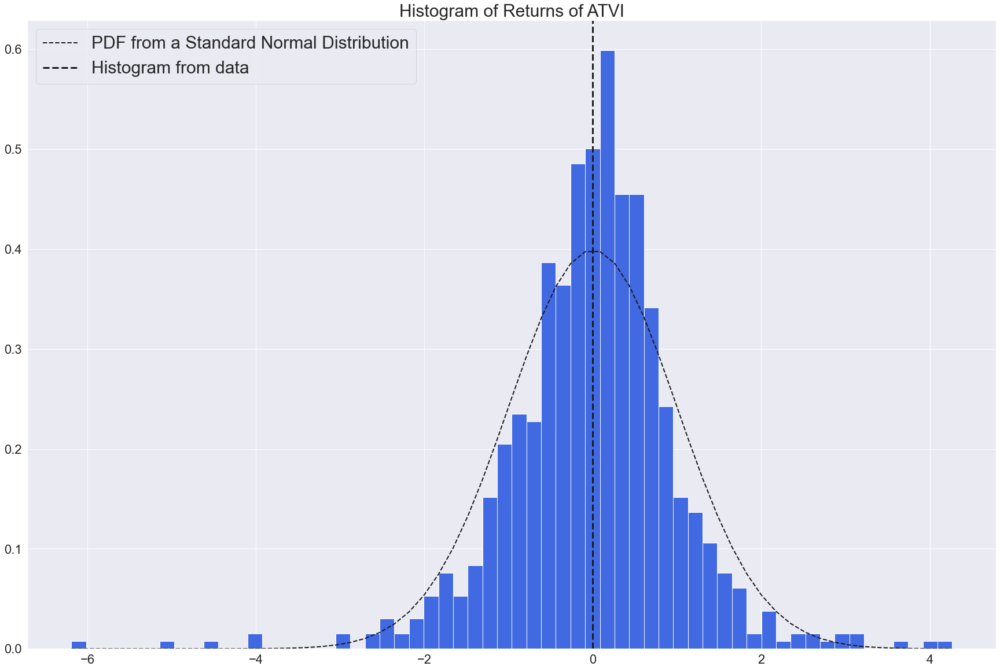

In [153]:
from scipy.stats import norm
import matplotlib.pyplot as plt


(mu, sigma) = norm.fit(preprocessing.scale(df["ATVI"]))

plt.figure(figsize=(30,20))
n, bins, patches = plt.hist(preprocessing.scale(df["ATVI"]), 60, density = True, color = 'royalblue')

y = norm.pdf( bins, mu, sigma)
l = plt.plot(bins, y, 'k--', linewidth=2)

plt.axvline(0, color='k', linestyle='--', linewidth = 3)

plt.title("Histogram of Returns of ATVI", fontsize=30)
plt.legend(["PDF from a Standard Normal Distribution","Histogram from data"], prop={'size': 30})

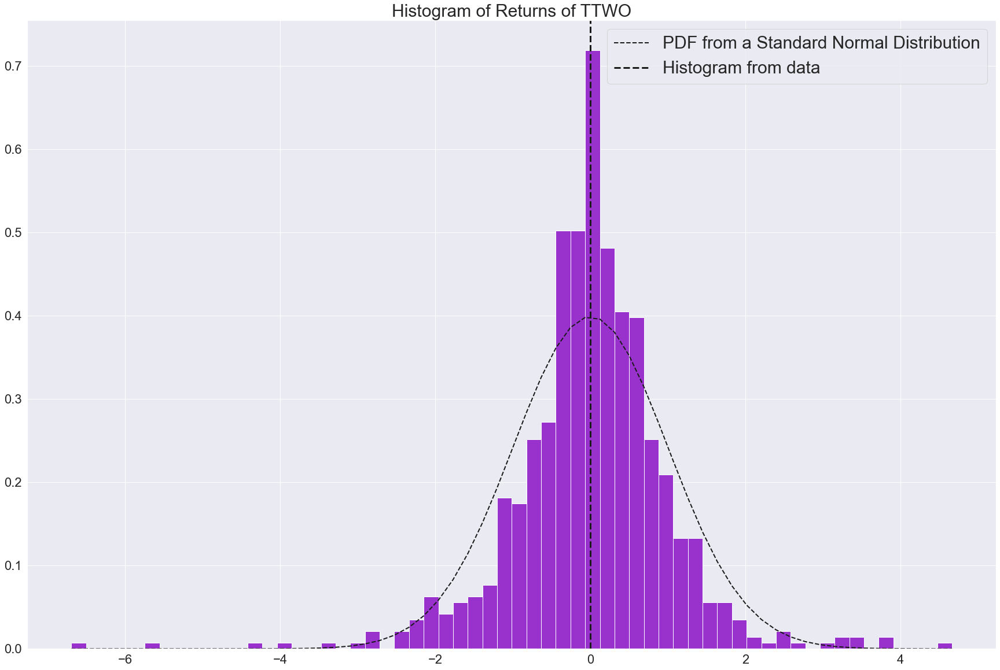

In [154]:
(mu, sigma) = norm.fit(preprocessing.scale(df["TTWO"]))

plt.figure(figsize=(30,20))
n, bins, patches = plt.hist(preprocessing.scale(df["TTWO"]), 60, density = True, color = 'darkorchid')

y = norm.pdf( bins, mu, sigma)
l = plt.plot(bins, y, 'k--', linewidth=2)

plt.axvline(0, color='k', linestyle='--', linewidth = 3)

plt.title("Histogram of Returns of TTWO", fontsize=30)
plt.legend(["PDF from a Standard Normal Distribution","Histogram from data"], prop={'size': 30})

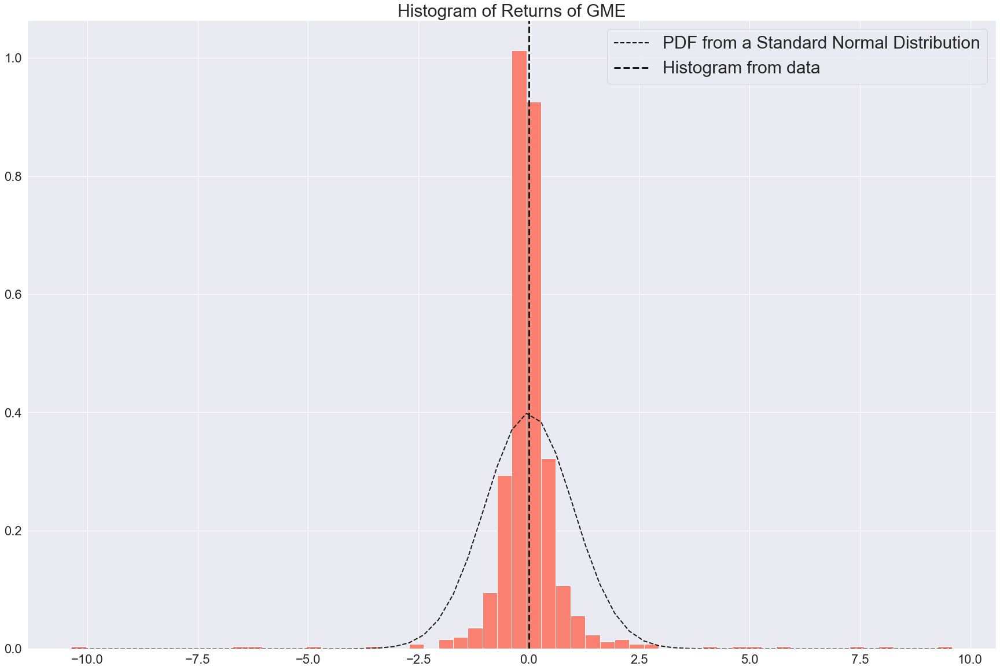

In [155]:
(mu, sigma) = norm.fit(preprocessing.scale(df["GME"]))

plt.figure(figsize=(30,20))
n, bins, patches = plt.hist(preprocessing.scale(df["GME"]), 60, density = True, color = 'salmon')

y = norm.pdf( bins, mu, sigma)
l = plt.plot(bins, y, 'k--', linewidth=2)

plt.axvline(0, color='k', linestyle='--', linewidth = 3)

plt.title("Histogram of Returns of GME", fontsize=30)
plt.legend(["PDF from a Standard Normal Distribution","Histogram from data"], prop={'size': 30})

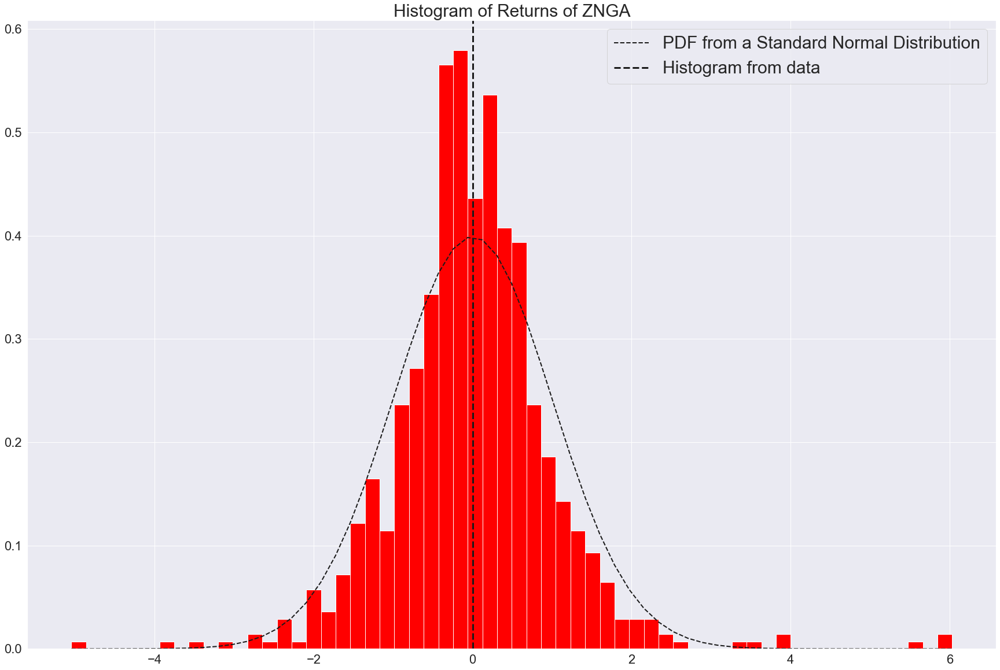

In [156]:
(mu, sigma) = norm.fit(preprocessing.scale(df["ZNGA"]))

plt.figure(figsize=(30,20))
n, bins, patches = plt.hist(preprocessing.scale(df["ZNGA"]), 60, density = True, color = 'red')

y = norm.pdf( bins, mu, sigma)
l = plt.plot(bins, y, 'k--', linewidth=2)

plt.axvline(0, color='k', linestyle='--', linewidth = 3)

plt.title("Histogram of Returns of ZNGA", fontsize=30)
plt.legend(["PDF from a Standard Normal Distribution","Histogram from data"], prop={'size': 30})

# Skew and FX Markets

In [105]:
rskew = pd.DataFrame([stats.skew(df[columns].values) for columns in df.columns], index = df.columns, columns = ['Skewness'])

In [106]:
rskew

,Skewness
ATVI,-0.500237
TTWO,-0.562803
GME,0.701010
ZNGA,0.637311


In [107]:
fxdf = pd.read_csv("FX Data.csv")
fxdf['Date'] = pd.to_datetime(fxdf['Date'])
fxdf = fxdf.set_index(['Date'])
fxdf.head()

,USDGBP,USDEUR,USDJPY,USDCHF
Date,,,,
2018-12-03,-0.002404,-0.001352,-0.002166,-0.002250
2018-03-13,-0.004041,-0.004450,0.001502,-0.003700
2018-03-14,0.000140,0.001857,-0.002442,0.000847
2018-03-15,0.001674,0.005058,0.000188,0.006855
2018-03-16,-0.000558,0.001230,-0.003108,0.000630


In [108]:
fxskew = pd.DataFrame([stats.skew(fxdf[columns].values) for columns in fxdf.columns], index = fxdf.columns, columns = ['Skewness'])

In [109]:
fxskew

,Skewness
USDGBP,0.151076
USDEUR,0.349265
USDJPY,1.003576
USDCHF,0.152228


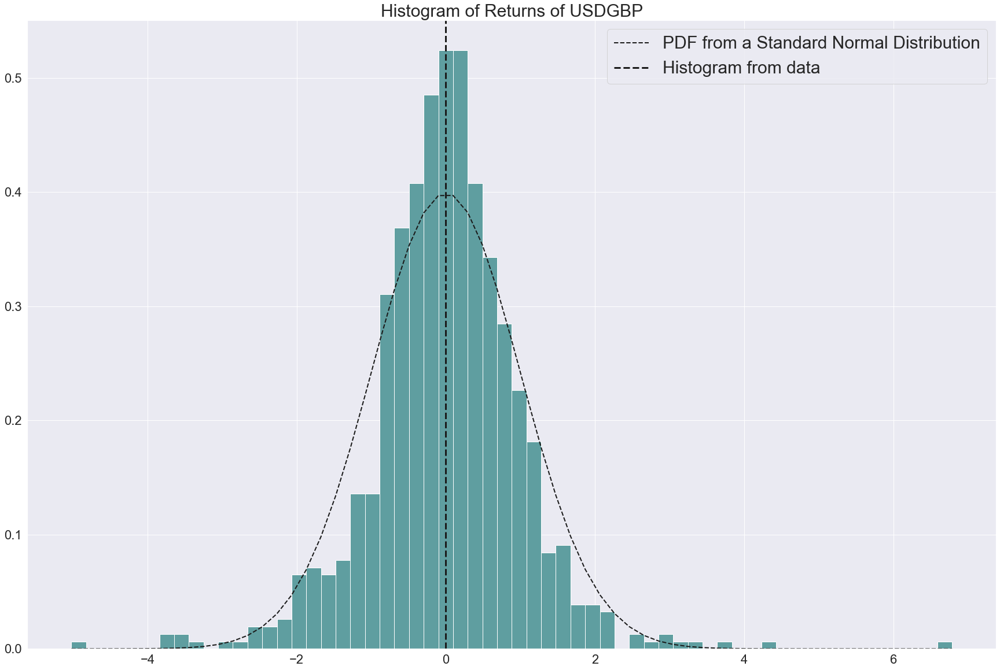

In [157]:

(mu, sigma) = norm.fit(preprocessing.scale(fxdf["USDGBP"]))

plt.figure(figsize=(30,20))
n, bins, patches = plt.hist(preprocessing.scale(fxdf["USDGBP"]), 60, density = True, color = 'cadetblue')

y = norm.pdf( bins, mu, sigma)
l = plt.plot(bins, y, 'k--', linewidth=2)

plt.axvline(0, color='k', linestyle='--', linewidth = 3)


plt.title("Histogram of Returns of USDGBP", fontsize=30)
plt.legend(["PDF from a Standard Normal Distribution","Histogram from data"], prop={'size': 30})

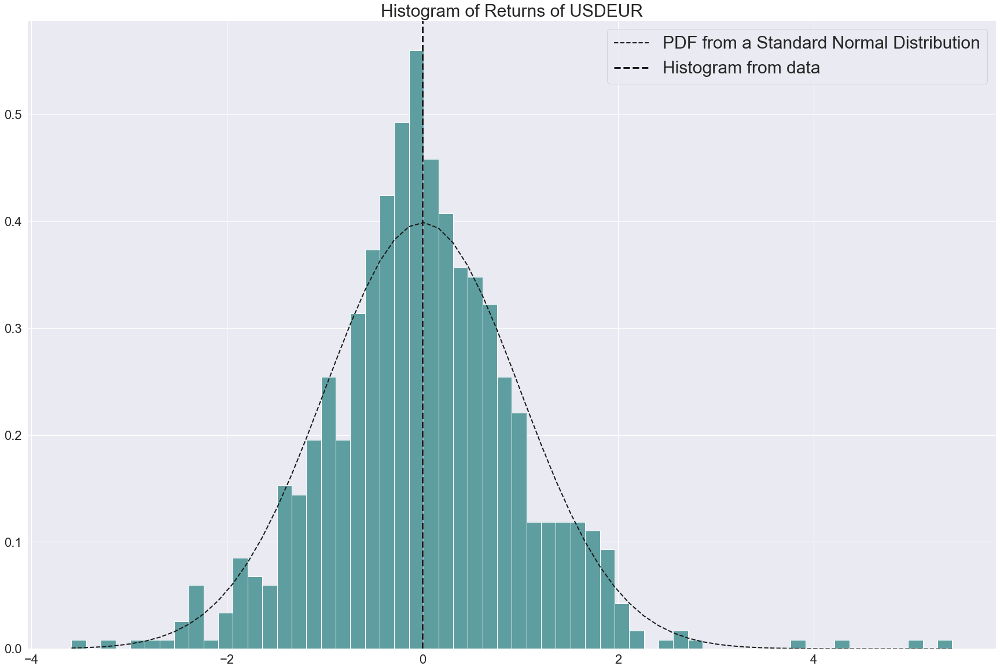

In [158]:

(mu, sigma) = norm.fit(preprocessing.scale(fxdf["USDEUR"]))

plt.figure(figsize=(30,20))
n, bins, patches = plt.hist(preprocessing.scale(fxdf["USDEUR"]), 60, density = True, color = 'cadetblue')

y = norm.pdf( bins, mu, sigma)
l = plt.plot(bins, y, 'k--', linewidth=2)

plt.axvline(0, color='k', linestyle='--', linewidth = 3)


plt.title("Histogram of Returns of USDEUR", fontsize=30)
plt.legend(["PDF from a Standard Normal Distribution","Histogram from data"], prop={'size': 30})

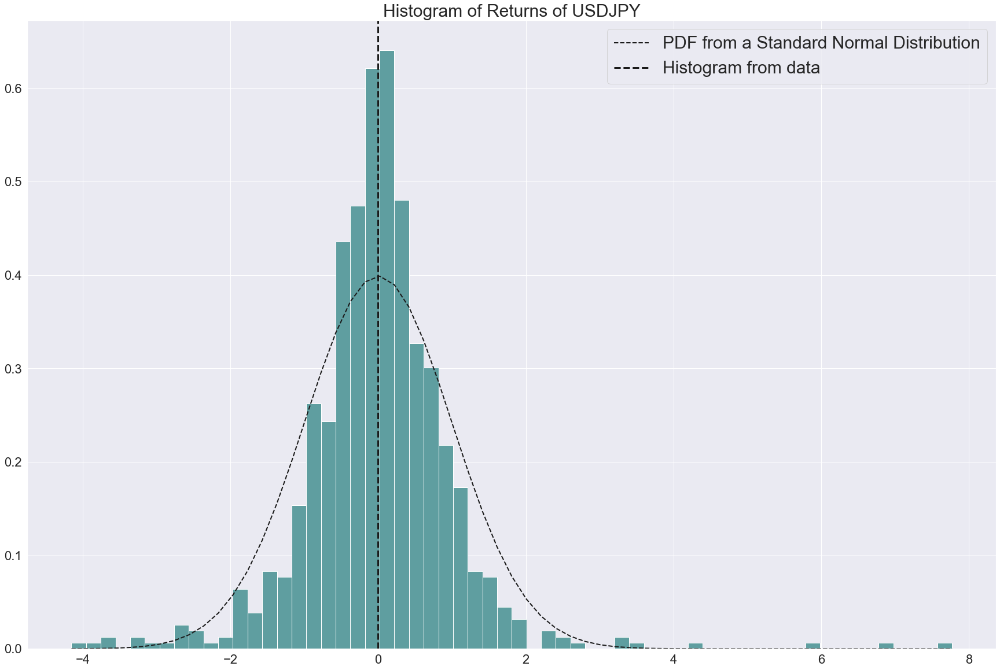

In [159]:

(mu, sigma) = norm.fit(preprocessing.scale(fxdf["USDJPY"]))

plt.figure(figsize=(30,20))
n, bins, patches = plt.hist(preprocessing.scale(fxdf["USDJPY"]), 60, density = True, color = 'cadetblue')

y = norm.pdf( bins, mu, sigma)
l = plt.plot(bins, y, 'k--', linewidth=2)

plt.axvline(0, color='k', linestyle='--', linewidth = 3)


plt.title("Histogram of Returns of USDJPY", fontsize=30)
plt.legend(["PDF from a Standard Normal Distribution","Histogram from data"], prop={'size': 30})

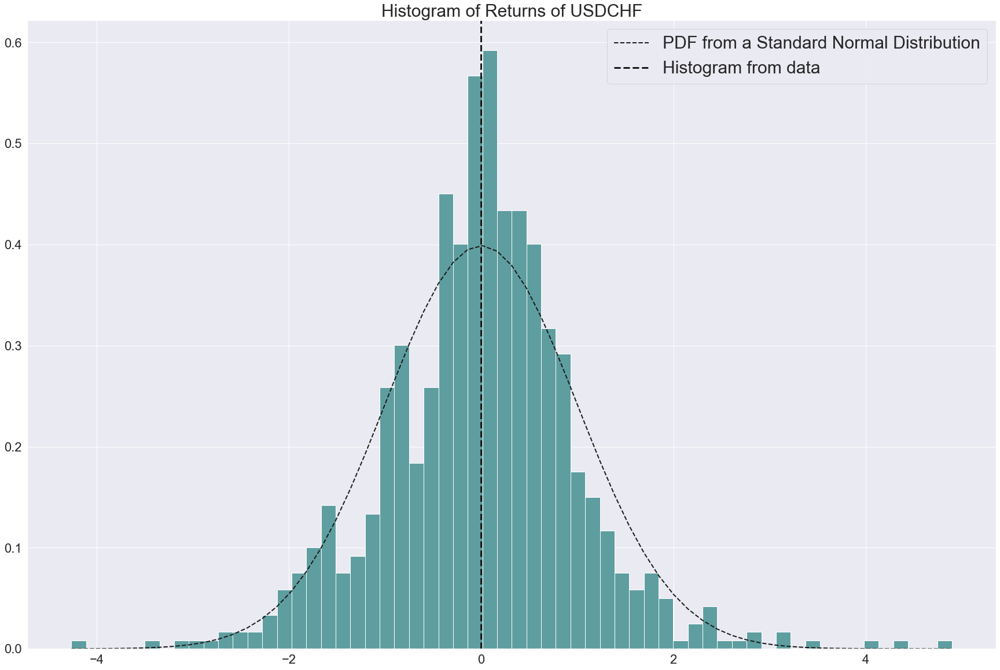

In [160]:

(mu, sigma) = norm.fit(preprocessing.scale(fxdf["USDCHF"]))

plt.figure(figsize=(30,20))
n, bins, patches = plt.hist(preprocessing.scale(fxdf["USDCHF"]), 60, density = True, color = 'cadetblue')

y = norm.pdf( bins, mu, sigma)
l = plt.plot(bins, y, 'k--', linewidth=2)

plt.axvline(0, color='k', linestyle='--', linewidth = 3)


plt.title("Histogram of Returns of USDCHF", fontsize=30)
plt.legend(["PDF from a Standard Normal Distribution","Histogram from data"], prop={'size': 30})

# JB Statistic

In [114]:
rjbs = pd.DataFrame([stats.jarque_bera(preprocessing.scale(df[columns].values)).statistic for columns in df.columns], index = df.columns, columns = ['JB Statistic'])

In [115]:
rjbs["p-value"] = [stats.jarque_bera(preprocessing.scale(df[columns].values)).pvalue for columns in df.columns]

In [116]:
rjbs

,JB Statistic,p-value
ATVI,682.119721,0.0
TTWO,1135.868351,0.0
GME,56490.739393,0.0
ZNGA,1147.728353,0.0


In [117]:
fxkurto = pd.DataFrame([stats.kurtosis(fxdf[columns].values) for columns in fxdf.columns], index = fxdf.columns, columns = ['Kurtosis'])

In [118]:
fxkurto

,Kurtosis
USDGBP,4.716171
USDEUR,2.271104
USDJPY,10.271412
USDCHF,2.045400


In [119]:
#JB Statistic for FX Return data
fxjbs = pd.DataFrame([stats.jarque_bera(preprocessing.scale(fxdf[columns].values)).statistic for columns in fxdf.columns], index = fxdf.columns, columns = ['JB Statistic'])

In [120]:
fxjbs["p-value"] = [stats.jarque_bera(preprocessing.scale(fxdf[columns].values)).pvalue for columns in fxdf.columns]

In [121]:
fxjbs

,JB Statistic,p-value
USDGBP,730.493541,0.0
USDEUR,184.666606,0.0
USDJPY,3582.561905,0.0
USDCHF,139.872499,0.0


# Multivariate Stylized Facts

In [122]:
df.corr()

,ATVI,TTWO,GME,ZNGA
ATVI,1.000000,0.652335,0.022086,0.528495
TTWO,0.652335,1.000000,0.033949,0.475336
GME,0.022086,0.033949,1.000000,0.000530
ZNGA,0.528495,0.475336,0.000530,1.000000


# Little evidence of cross-correlation except for concurrent (i.e. contemporaneous retunrs)

In [123]:
from scipy.stats.stats import pearsonr   


def lag_cross_corr(x,y,n = 100):
    lcross_cov = pd.DataFrame(index = list(range(1,n+1)), columns = [x.name + "-" + y.name])
    
    for i in range(1, n+1):
        lcross_cov.iloc[i-1,0] =  pearsonr(x[i:], y[0:(len(y)-i)])[0]
    
    return lcross_cov

In [124]:
cross_corr_lag = pd.DataFrame(index = list(range(1,101)), columns = ["ATVI-TTWO","ATVI-GME","ATVI-ZNGA","TTWO-ATVI","TTWO-GME","TTWO-ZNGA","GME-ATVI","GME-TTWO","GME-ZNGA","ZNGA-ATVI","ZNGA-TTWO","ZNGA-GME"])

for name in cross_corr_lag.columns:
    s1, s2 = name.split("-")
    cross_corr_lag[name] = lag_cross_corr(df[s1],df[s2])

In [125]:
cross_corr_lag

,ATVI-TTWO,ATVI-GME,ATVI-ZNGA,TTWO-ATVI,TTWO-GME,TTWO-ZNGA,GME-ATVI,GME-TTWO,GME-ZNGA,ZNGA-ATVI,ZNGA-TTWO,ZNGA-GME
1,-0.125664,-0.0745565,-0.141662,-0.0757928,-0.0445637,-0.141079,-0.0229858,-0.0572366,-0.0343522,-0.035087,-0.107496,-0.0922157
2,-0.0119322,0.0610391,-0.0240223,-0.00117794,0.0376965,-0.000859128,-0.0517061,-0.0288712,-0.0241979,0.0163011,0.0238739,0.00269631
3,0.0162593,-0.048595,-0.00280261,-0.00838849,-0.0139115,-0.0430281,-0.0282508,-0.0514863,0.0122684,-0.0112451,-0.0235664,0.0264737
4,-0.0437647,0.00152134,-0.0738587,-0.00762952,0.0216359,-0.025461,0.0361534,0.0591315,0.0336008,0.00881393,-0.036304,-0.0149631
5,-0.0963069,-0.000293847,-0.0225743,-0.100305,0.00430058,-0.0691601,0.013965,0.0241998,0.00296772,-0.0941376,-0.076029,-0.0524275
...,...,...,...,...,...,...,...,...,...,...,...,...
96,0.000299054,0.0503685,0.0172233,0.0274606,0.00208801,0.039743,-0.0101218,-0.0379362,-0.0201508,0.0335853,0.0123552,0.0553428
97,0.0156189,0.0135639,-0.00820984,0.0407784,0.00295094,0.0184916,-0.018198,-0.0343659,0.0017765,0.0141503,0.0179175,0.0272041
98,-0.0413799,0.02433,-0.0564279,-0.0542673,0.026732,-0.0610528,-0.0461553,-0.0111876,-0.0360567,-0.0414853,0.000250528,0.0855278
99,0.0347744,-0.0228896,-0.0268517,0.0516739,-0.00648721,-0.0058389,0.0339475,0.0385131,0.0463209,0.0219012,0.0158455,-0.0111982


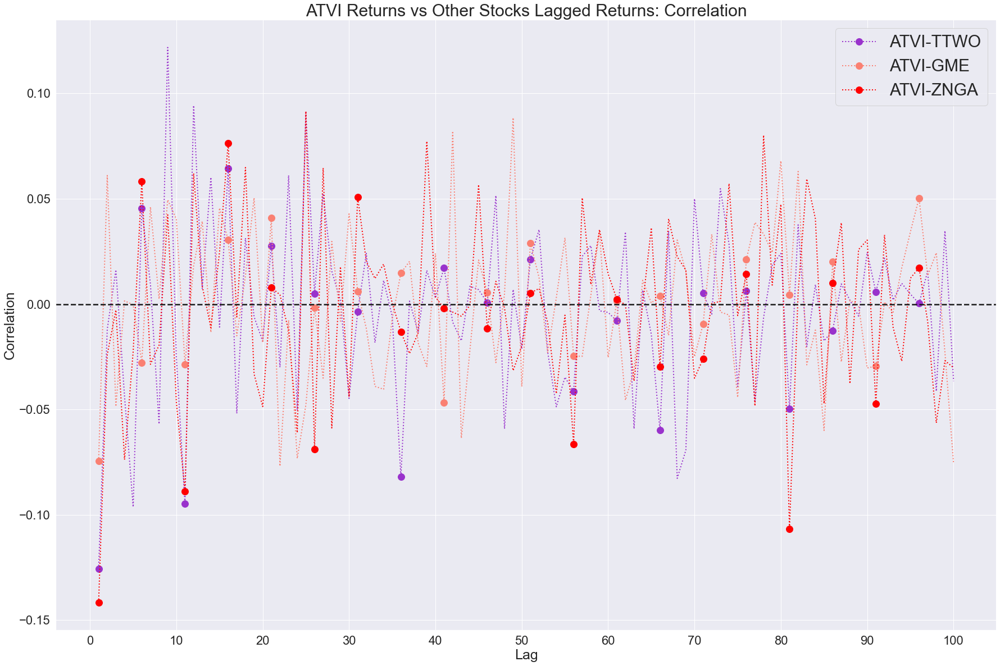

In [126]:
plt.figure(figsize=(30,20))
plt.plot(cross_corr_lag['ATVI-TTWO'], color = "darkorchid", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'darkorchid', markersize = 12, linewidth = 2)
plt.plot(cross_corr_lag['ATVI-GME'], color = "salmon", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'salmon', markersize = 12, linewidth = 2)
plt.plot(cross_corr_lag['ATVI-ZNGA'], color = "red", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'red', markersize = 12, linewidth = 2)
plt.axhline(y=0, color='k', linestyle='--', linewidth = 2.5)
plt.title("ATVI Returns vs Other Stocks Lagged Returns: Correlation", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)
plt.legend(['ATVI-TTWO', 'ATVI-GME','ATVI-ZNGA'], prop={'size': 30})

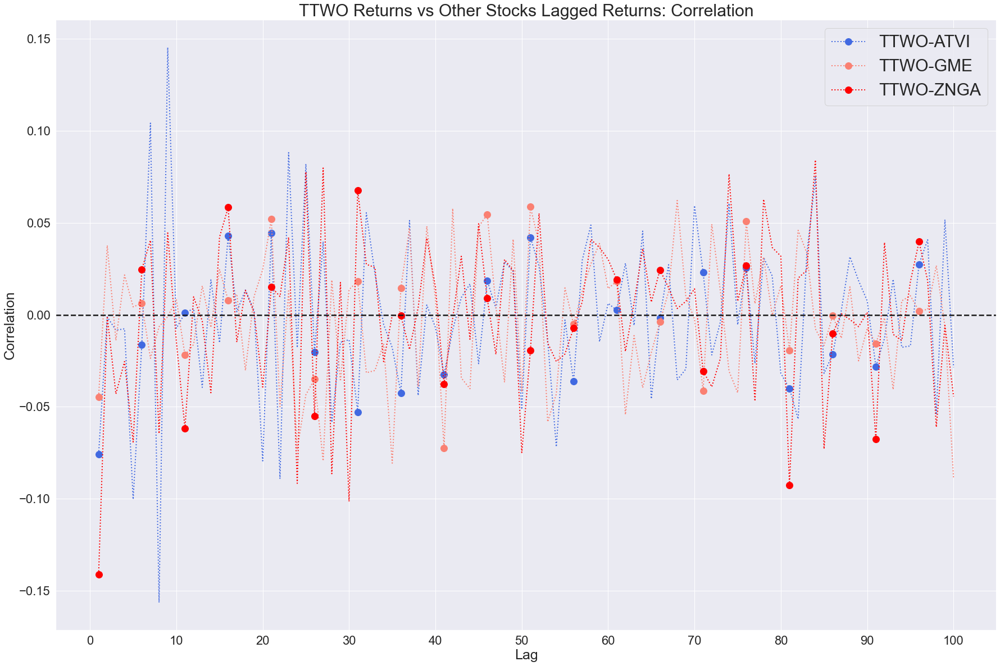

In [127]:
plt.figure(figsize=(30,20))
plt.plot(cross_corr_lag['TTWO-ATVI'], color = "royalblue", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'royalblue', markersize = 12, linewidth = 2)
plt.plot(cross_corr_lag['TTWO-GME'], color = "salmon", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'salmon', markersize = 12, linewidth = 2)
plt.plot(cross_corr_lag['TTWO-ZNGA'], color = "red", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'red', markersize = 12, linewidth = 2)
plt.axhline(y=0, color='k', linestyle='--', linewidth = 2.5)
plt.title("TTWO Returns vs Other Stocks Lagged Returns: Correlation", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)
plt.legend(['TTWO-ATVI', 'TTWO-GME','TTWO-ZNGA'], prop={'size': 30})

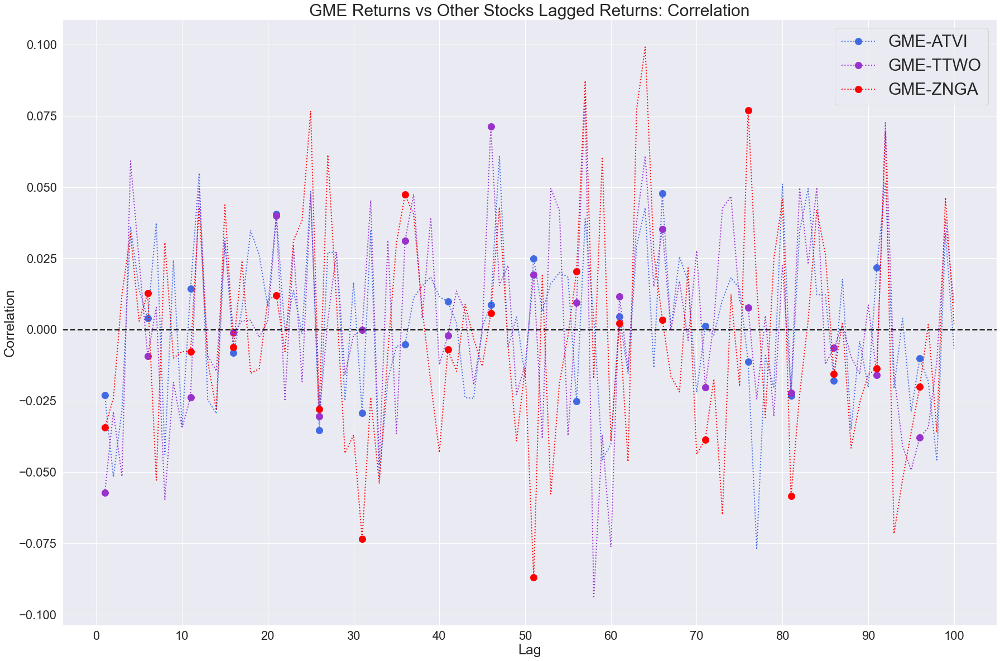

In [128]:
plt.figure(figsize=(30,20))
plt.plot(cross_corr_lag['GME-ATVI'], color = "royalblue", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'royalblue', markersize = 12, linewidth = 2)
plt.plot(cross_corr_lag['GME-TTWO'], color = "darkorchid", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'darkorchid', markersize = 12, linewidth = 2)
plt.plot(cross_corr_lag['GME-ZNGA'], color = "red", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'red', markersize = 12, linewidth = 2)
plt.axhline(y=0, color='k', linestyle='--', linewidth = 2.5)
plt.title("GME Returns vs Other Stocks Lagged Returns: Correlation", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)
plt.legend(['GME-ATVI', 'GME-TTWO','GME-ZNGA'], prop={'size': 30})

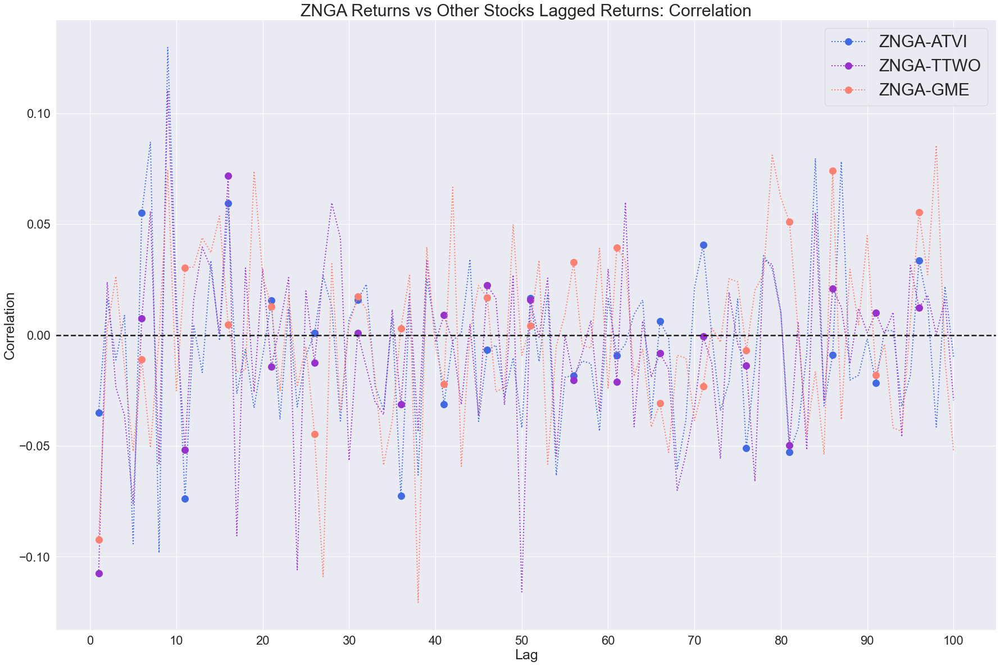

In [129]:
plt.figure(figsize=(30,20))
plt.plot(cross_corr_lag['ZNGA-ATVI'], color = "royalblue", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'royalblue', markersize = 12, linewidth = 2)
plt.plot(cross_corr_lag['ZNGA-TTWO'], color = "darkorchid", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'darkorchid', markersize = 12, linewidth = 2)
plt.plot(cross_corr_lag['ZNGA-GME'], color = "salmon", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'salmon', markersize = 12, linewidth = 2)
plt.axhline(y=0, color='k', linestyle='--', linewidth = 2.5)
plt.title("ZNGA Returns vs Other Stocks Lagged Returns: Correlation", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)
plt.legend(['ZNGA-ATVI', 'ZNGA-TTWO','ZNGA-GME'], prop={'size': 30})

# Multivariate series of absolute returns show profound evidence of cross correlations.

In [130]:
df_abs = df.abs()

In [131]:
df.head()

,ATVI,TTWO,GME,ZNGA
Date,,,,
2018-03-12,-0.010127,-0.004324,-0.011033,0.004637
2018-03-13,-0.012174,-0.019632,0.003851,-0.013423
2018-03-14,-0.022778,-0.038259,-0.009656,0.018742
2018-03-15,-0.011382,-0.003026,-0.009750,0.023592
2018-03-16,-0.023440,-0.014895,0.007159,-0.010417


In [132]:
df_abs.head()

,ATVI,TTWO,GME,ZNGA
Date,,,,
2018-03-12,0.010127,0.004324,0.011033,0.004637
2018-03-13,0.012174,0.019632,0.003851,0.013423
2018-03-14,0.022778,0.038259,0.009656,0.018742
2018-03-15,0.011382,0.003026,0.009750,0.023592
2018-03-16,0.023440,0.014895,0.007159,0.010417


In [133]:
cross_corr_abs_lag = pd.DataFrame(index = list(range(1,101)), columns = ["ATVI-TTWO","ATVI-GME","ATVI-ZNGA","TTWO-ATVI","TTWO-GME","TTWO-ZNGA","GME-ATVI","GME-TTWO","GME-ZNGA","ZNGA-ATVI","ZNGA-TTWO","ZNGA-GME"])

for name in cross_corr_lag.columns:
    s1, s2 = name.split("-")
    cross_corr_abs_lag[name] = lag_cross_corr(df_abs[s1],df_abs[s2])

In [134]:
cross_corr_abs_lag

,ATVI-TTWO,ATVI-GME,ATVI-ZNGA,TTWO-ATVI,TTWO-GME,TTWO-ZNGA,GME-ATVI,GME-TTWO,GME-ZNGA,ZNGA-ATVI,ZNGA-TTWO,ZNGA-GME
1,0.101058,0.0399928,0.152153,0.165405,-0.000313093,0.284595,-0.00231497,0.015411,0.0341978,0.117311,0.149311,0.0537437
2,0.0923449,-0.00818433,0.127619,0.141955,-0.00029237,0.141073,0.0162825,0.0166249,0.0705412,0.102614,0.113774,0.00990064
3,0.144485,0.0814249,0.121089,0.0922014,0.0418772,0.138499,0.00362417,0.000304226,0.0682944,0.069224,0.103329,0.0663065
4,0.136651,-0.0132206,0.0879425,0.196091,-0.0131118,0.122927,0.0202494,0.0359308,0.13315,0.138599,0.0746709,0.0507914
5,0.118551,0.0793171,0.113054,0.140522,0.0659633,0.0893007,0.024862,-0.00784216,0.083575,0.0383044,0.0461003,0.0995806
...,...,...,...,...,...,...,...,...,...,...,...,...
96,-0.0455725,-0.0495293,-0.0845343,-0.136138,-0.0107532,-0.0483502,0.0122017,-0.0180174,-0.0235355,-0.101004,-0.0463539,-0.0135549
97,-0.0351125,-0.0405265,-0.0149354,-0.053758,-0.0473603,-0.0768724,-0.0207039,-0.010131,0.0062818,-0.114276,-0.0828632,0.0104629
98,-0.043141,-0.0156289,-0.0526287,0.0165881,-0.064343,-0.0315159,0.0396412,0.0259127,0.0106198,-0.0398145,-0.0565556,0.0135349
99,-0.0111013,-0.0255062,-0.0358079,-0.0512524,-0.00906053,0.0136506,0.0105219,-0.00421392,-0.0202801,-0.0946522,-0.0303772,0.0439419


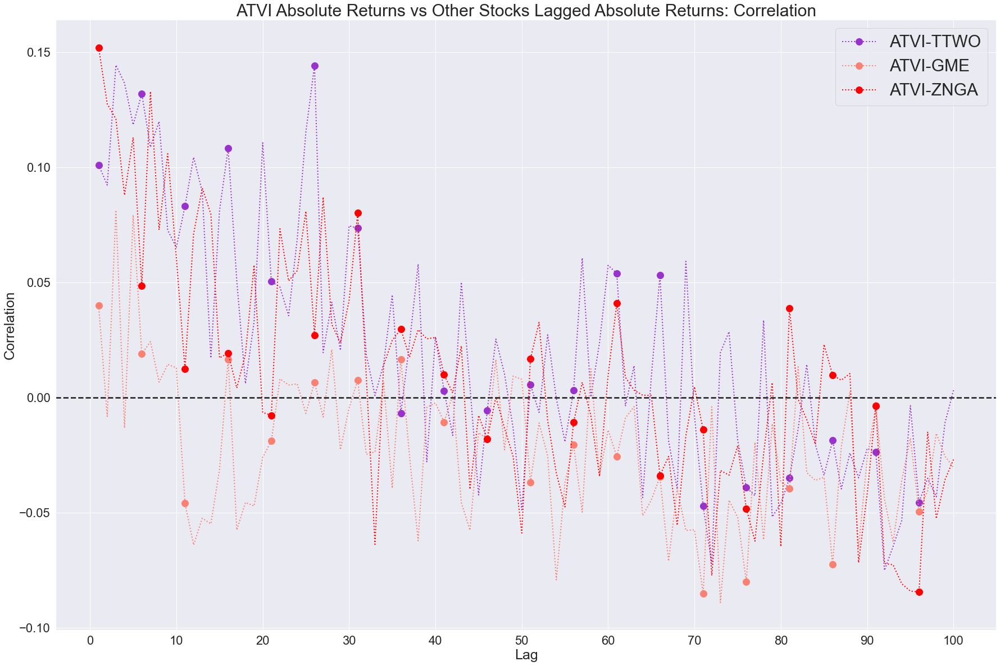

In [135]:
plt.figure(figsize=(30,20))
plt.plot(cross_corr_abs_lag['ATVI-TTWO'], color = "darkorchid", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'darkorchid', markersize = 12, linewidth = 2)
plt.plot(cross_corr_abs_lag['ATVI-GME'], color = "salmon", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'salmon', markersize = 12, linewidth = 2)
plt.plot(cross_corr_abs_lag['ATVI-ZNGA'], color = "red", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'red', markersize = 12, linewidth = 2)
plt.axhline(y=0, color='k', linestyle='--', linewidth = 2.5)
plt.title("ATVI Absolute Returns vs Other Stocks Lagged Absolute Returns: Correlation", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)
plt.legend(['ATVI-TTWO', 'ATVI-GME','ATVI-ZNGA'], prop={'size': 30})

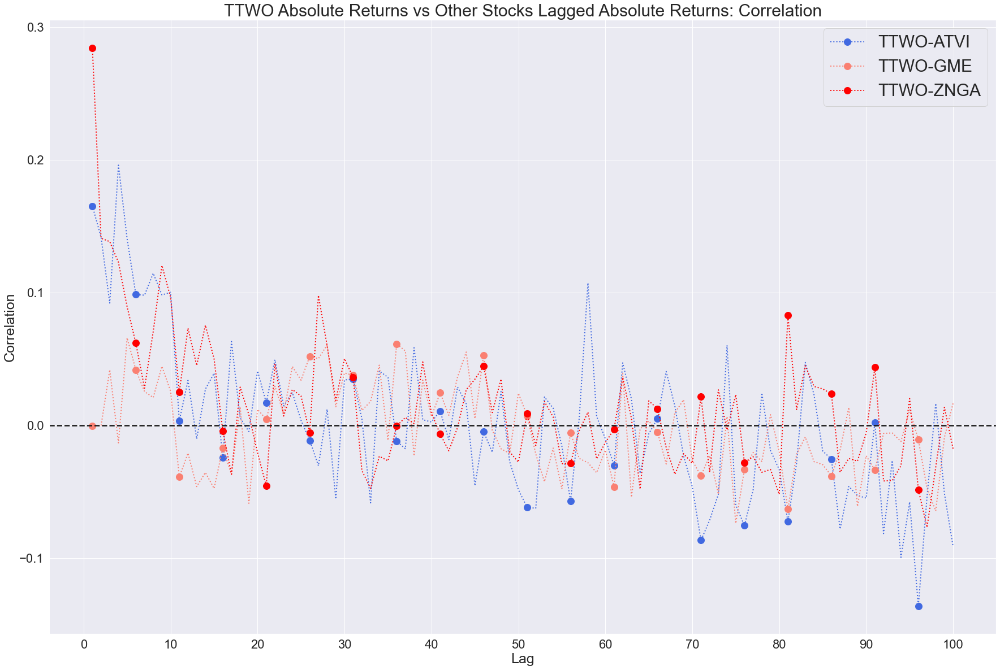

In [136]:
plt.figure(figsize=(30,20))
plt.plot(cross_corr_abs_lag['TTWO-ATVI'], color = "royalblue", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'royalblue', markersize = 12, linewidth = 2)
plt.plot(cross_corr_abs_lag['TTWO-GME'], color = "salmon", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'salmon', markersize = 12, linewidth = 2)
plt.plot(cross_corr_abs_lag['TTWO-ZNGA'], color = "red", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'red', markersize = 12, linewidth = 2)
plt.axhline(y=0, color='k', linestyle='--', linewidth = 2.5)
plt.title("TTWO Absolute Returns vs Other Stocks Lagged Absolute Returns: Correlation", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)
plt.legend(['TTWO-ATVI', 'TTWO-GME','TTWO-ZNGA'], prop={'size': 30})

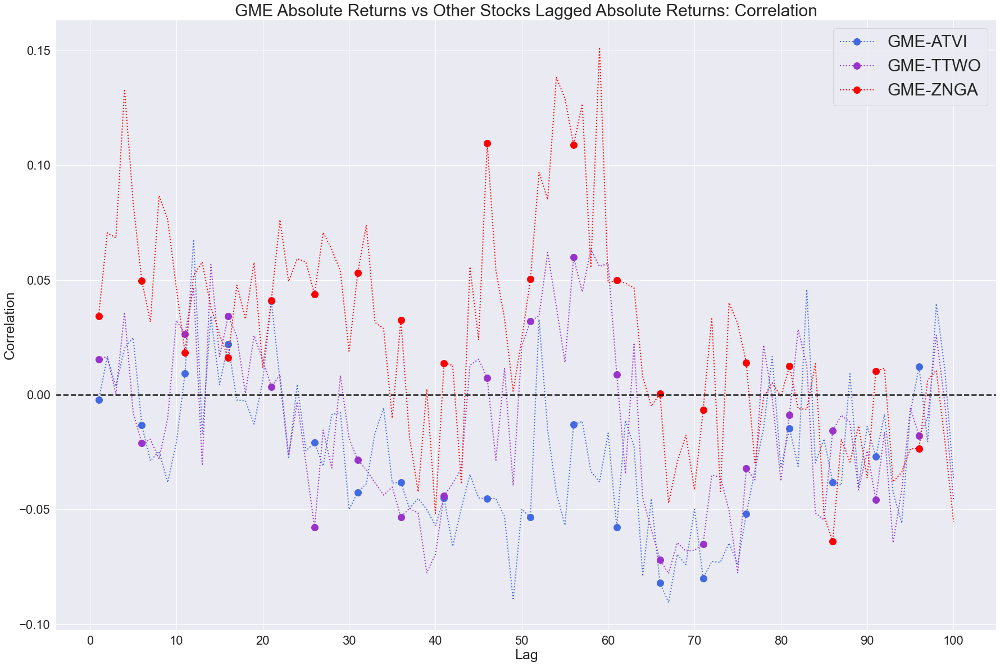

In [137]:
plt.figure(figsize=(30,20))
plt.plot(cross_corr_abs_lag['GME-ATVI'], color = "royalblue", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'royalblue', markersize = 12, linewidth = 2)
plt.plot(cross_corr_abs_lag['GME-TTWO'], color = "darkorchid", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'darkorchid', markersize = 12, linewidth = 2)
plt.plot(cross_corr_abs_lag['GME-ZNGA'], color = "red", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'red', markersize = 12, linewidth = 2)
plt.axhline(y=0, color='k', linestyle='--', linewidth = 2.5)
plt.title("GME Absolute Returns vs Other Stocks Lagged Absolute Returns: Correlation", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)
plt.legend(['GME-ATVI', 'GME-TTWO','GME-ZNGA'], prop={'size': 30})

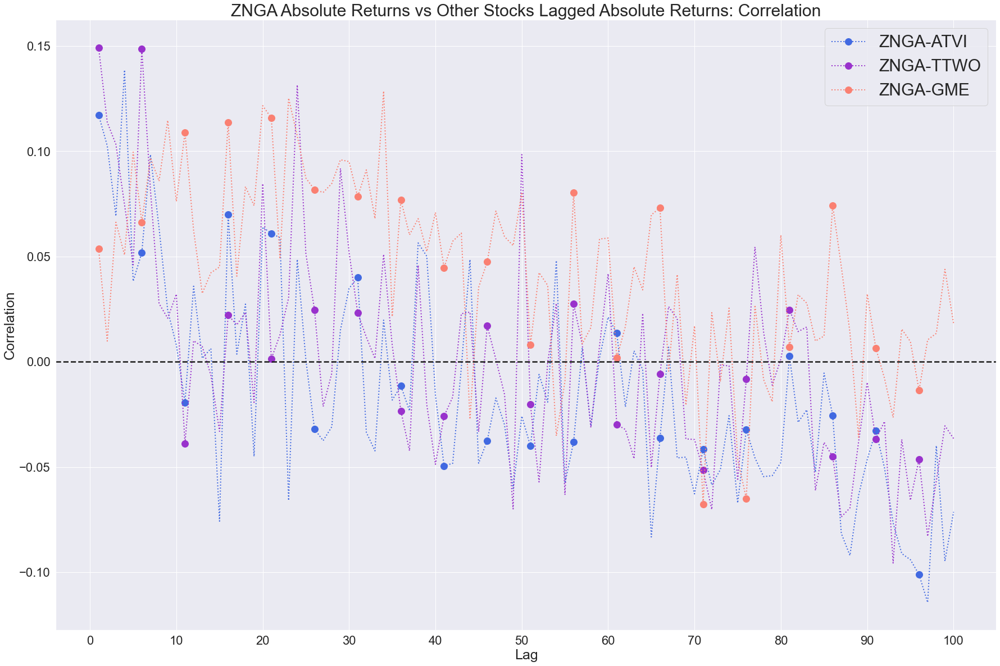

In [138]:
plt.figure(figsize=(30,20))
plt.plot(cross_corr_abs_lag['ZNGA-ATVI'], color = "royalblue", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'royalblue', markersize = 12, linewidth = 2)
plt.plot(cross_corr_abs_lag['ZNGA-TTWO'], color = "darkorchid", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'darkorchid', markersize = 12, linewidth = 2)
plt.plot(cross_corr_abs_lag['ZNGA-GME'], color = "salmon", linestyle = 'dotted', markevery = 5, marker = 'o', markerfacecolor = 'salmon', markersize = 12, linewidth = 2)
plt.axhline(y=0, color='k', linestyle='--', linewidth = 2.5)
plt.title("ZNGA Absolute Returns vs Other Stocks Lagged Absolute Returns: Correlation", fontsize = 30)
plt.xticks(np.arange(0,101, 10))
plt.xlabel("Lag", fontsize = 25)
plt.ylabel("Correlation", fontsize = 25)
plt.legend(['ZNGA-ATVI', 'ZNGA-TTWO','ZNGA-GME'], prop={'size': 30})

# Little evidence of cross-correlation except for concurrent (i.e. contemporaneous retunrs): Stem plots for correlations

<ipython-input-255-8168a57d601b>:13: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = ax[i,0].stem(list(range(1,101)), ATVI_cross_corr_lag.iloc[:,i].values, linefmt = "k")
<ipython-input-255-8168a57d601b>:20: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = ax[i,1].stem(list(range(1,101)), ATVI_cross_corr_abs_lag.iloc[:,i].values, linefmt = "k")
<ipython-input-255-8168a57d601b>:13: UserWarning: In Matplotlib 3.3 individual lin

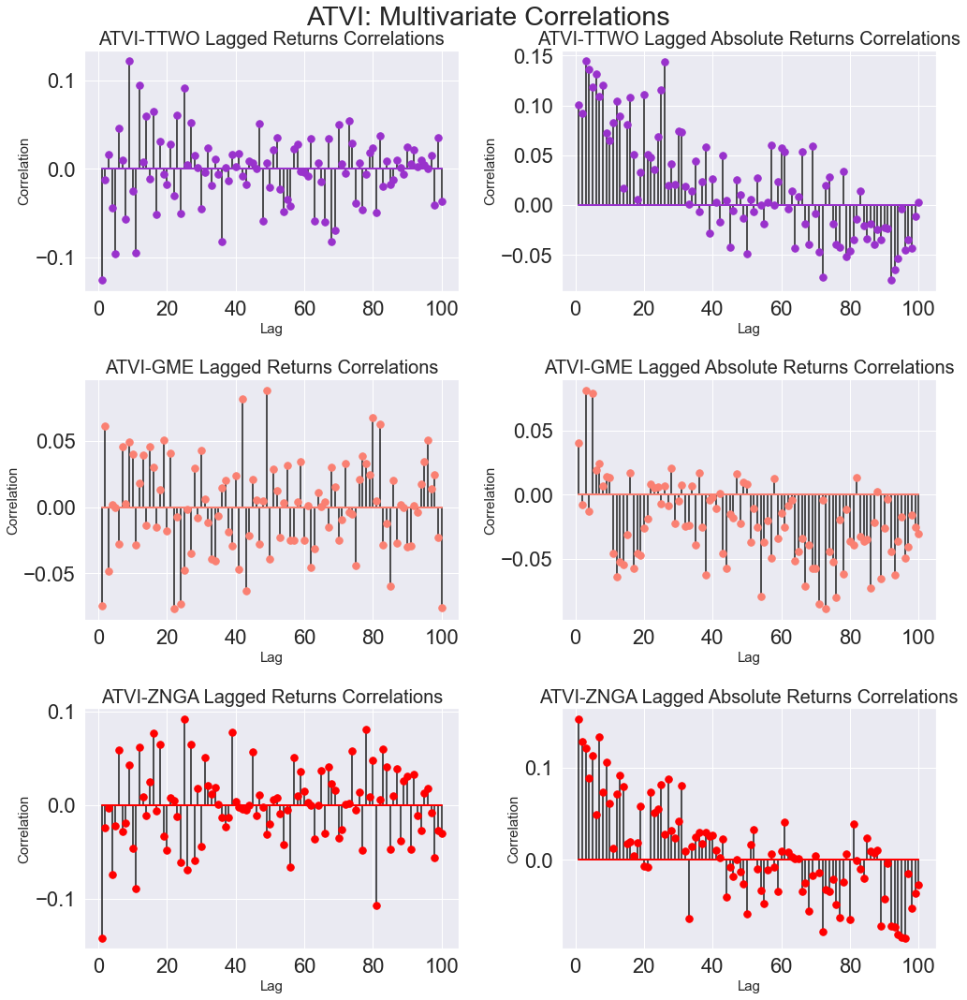

In [255]:
fig, ax = plt.subplots(3, 2, figsize=(15,15))
fig.suptitle('ATVI: Multivariate Correlations', y = 1)

colors = ['darkorchid','salmon','red']

col1_title = " Lagged Returns Correlations"
col2_title = " Lagged Absolute Returns Correlations"

ATVI_cross_corr_lag = pd.concat([cross_corr_lag['ATVI-TTWO'], cross_corr_lag['ATVI-GME'], cross_corr_lag['ATVI-ZNGA']], axis = 1)
ATVI_cross_corr_abs_lag = pd.concat([cross_corr_abs_lag['ATVI-TTWO'], cross_corr_abs_lag['ATVI-GME'], cross_corr_abs_lag['ATVI-ZNGA']], axis = 1)

for j,i in enumerate([0,1,2]):
    markerline, stemlines, baseline = ax[i,0].stem(list(range(1,101)), ATVI_cross_corr_lag.iloc[:,i].values, linefmt = "k")   
    ax[i,0].set_title(ATVI_cross_corr_lag.columns[j] + col1_title, fontsize = 20)
    ax[i,0].set_xlabel("Lag", fontsize = 15)
    ax[i,0].set_ylabel("Correlation", fontsize = 15)
    plt.setp(baseline, color= colors[j], linewidth=2)
    plt.setp(markerline, color = colors[j], markersize = 7.5)
    
    markerline, stemlines, baseline = ax[i,1].stem(list(range(1,101)), ATVI_cross_corr_abs_lag.iloc[:,i].values, linefmt = "k")   
    ax[i,1].set_title(ATVI_cross_corr_abs_lag.columns[j] + col2_title, fontsize = 20)
    ax[i,1].set_xlabel("Lag", fontsize = 15)
    ax[i,1].set_ylabel("Correlation", fontsize = 15)
    plt.setp(baseline, color= colors[j], linewidth=2)
    plt.setp(markerline, color = colors[j], markersize = 7.5)
    
fig.tight_layout()

<ipython-input-256-c9c03cfc5dcb>:13: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = ax[i,0].stem(list(range(1,101)), TTWO_cross_corr_lag.iloc[:,i].values, linefmt = "k")
<ipython-input-256-c9c03cfc5dcb>:20: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = ax[i,1].stem(list(range(1,101)), TTWO_cross_corr_abs_lag.iloc[:,i].values, linefmt = "k")
<ipython-input-256-c9c03cfc5dcb>:13: UserWarning: In Matplotlib 3.3 individual lin

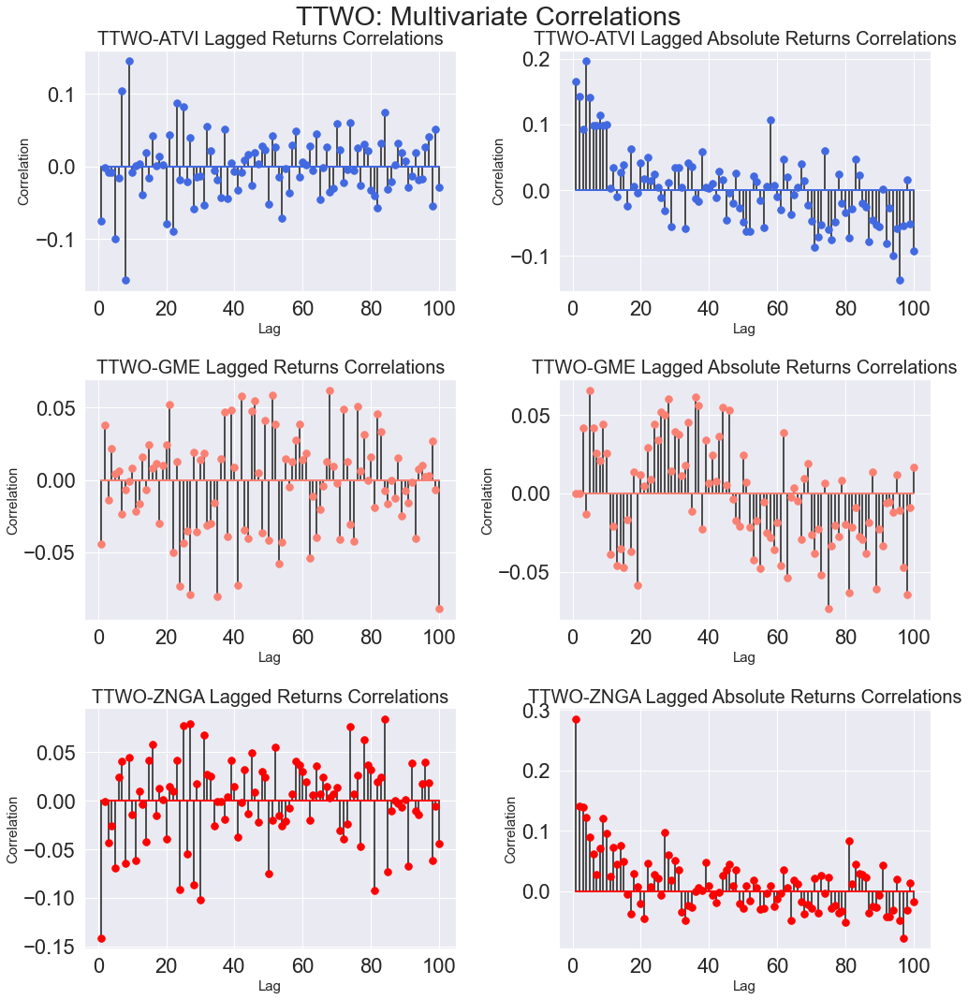

In [256]:
fig, ax = plt.subplots(3, 2, figsize=(15,15))
fig.suptitle('TTWO: Multivariate Correlations'+'\n', y = 1)

colors = ['royalblue','salmon','red']

col1_title = " Lagged Returns Correlations"
col2_title = " Lagged Absolute Returns Correlations"

TTWO_cross_corr_lag = pd.concat([cross_corr_lag['TTWO-ATVI'], cross_corr_lag['TTWO-GME'], cross_corr_lag['TTWO-ZNGA']], axis = 1)
TTWO_cross_corr_abs_lag = pd.concat([cross_corr_abs_lag['TTWO-ATVI'], cross_corr_abs_lag['TTWO-GME'], cross_corr_abs_lag['TTWO-ZNGA']], axis = 1)

for j,i in enumerate([0,1,2]):
    markerline, stemlines, baseline = ax[i,0].stem(list(range(1,101)), TTWO_cross_corr_lag.iloc[:,i].values, linefmt = "k")   
    ax[i,0].set_title(TTWO_cross_corr_lag.columns[j] + col1_title, fontsize = 20)
    ax[i,0].set_xlabel("Lag", fontsize = 15)
    ax[i,0].set_ylabel("Correlation", fontsize = 15)
    plt.setp(baseline, color= colors[j], linewidth=2)
    plt.setp(markerline, color = colors[j], markersize = 7.5)
    
    markerline, stemlines, baseline = ax[i,1].stem(list(range(1,101)), TTWO_cross_corr_abs_lag.iloc[:,i].values, linefmt = "k")   
    ax[i,1].set_title(TTWO_cross_corr_abs_lag.columns[j] + col2_title, fontsize = 20)
    ax[i,1].set_xlabel("Lag", fontsize = 15)
    ax[i,1].set_ylabel("Correlation", fontsize = 15)
    plt.setp(baseline, color= colors[j], linewidth=2)
    plt.setp(markerline, color = colors[j], markersize = 7.5)
    
fig.tight_layout()

<ipython-input-259-fa62a2aed6f6>:13: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = ax[i,0].stem(list(range(1,101)), GME_cross_corr_lag.iloc[:,i].values, linefmt = "k")
<ipython-input-259-fa62a2aed6f6>:20: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = ax[i,1].stem(list(range(1,101)), GME_cross_corr_abs_lag.iloc[:,i].values, linefmt = "k")
<ipython-input-259-fa62a2aed6f6>:13: UserWarning: In Matplotlib 3.3 individual lines

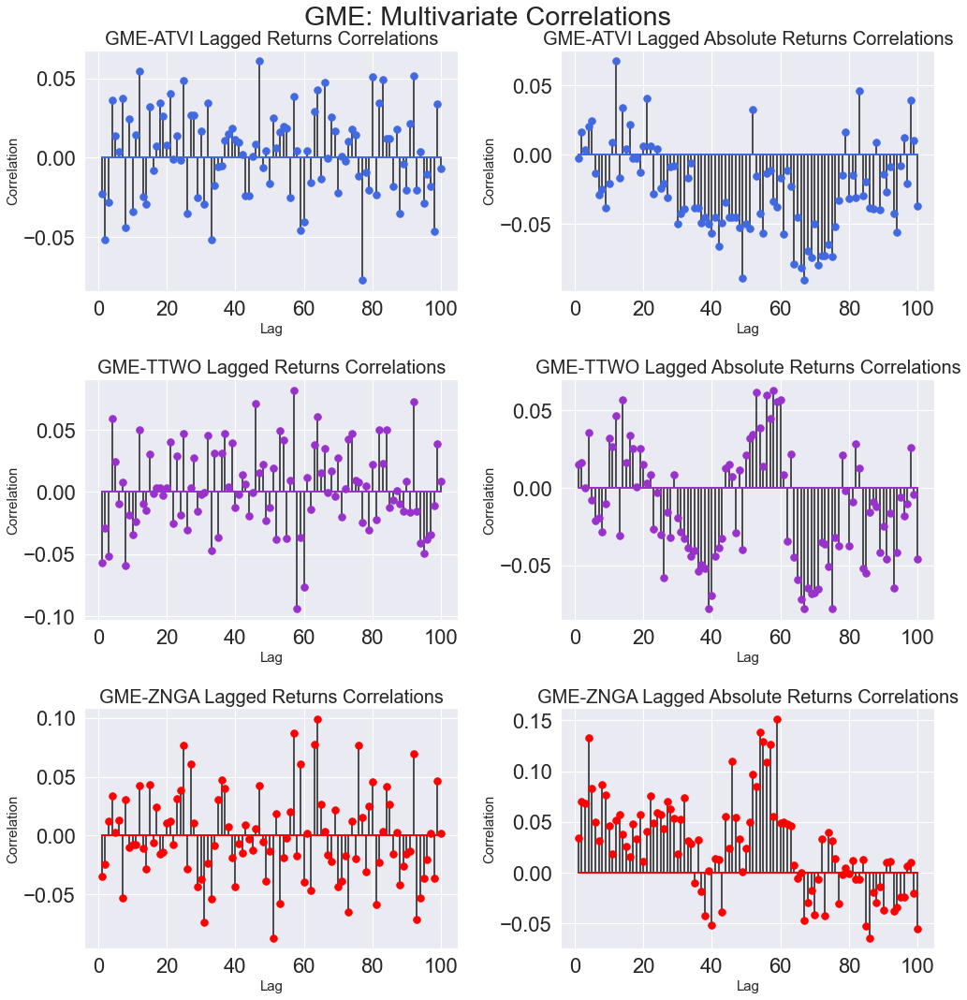

In [259]:
fig, ax = plt.subplots(3, 2, figsize=(15,15))
fig.suptitle('GME: Multivariate Correlations'+'\n', y = 1)

colors = ['royalblue','darkorchid','red']

col1_title = " Lagged Returns Correlations"
col2_title = " Lagged Absolute Returns Correlations"

GME_cross_corr_lag = pd.concat([cross_corr_lag['GME-ATVI'], cross_corr_lag['GME-TTWO'], cross_corr_lag['GME-ZNGA']], axis = 1)
GME_cross_corr_abs_lag = pd.concat([cross_corr_abs_lag['GME-ATVI'], cross_corr_abs_lag['GME-TTWO'], cross_corr_abs_lag['GME-ZNGA']], axis = 1)

for j,i in enumerate([0,1,2]):
    markerline, stemlines, baseline = ax[i,0].stem(list(range(1,101)), GME_cross_corr_lag.iloc[:,i].values, linefmt = "k")   
    ax[i,0].set_title(GME_cross_corr_lag.columns[j] + col1_title, fontsize = 20)
    ax[i,0].set_xlabel("Lag", fontsize = 15)
    ax[i,0].set_ylabel("Correlation", fontsize = 15)
    plt.setp(baseline, color= colors[j], linewidth=2)
    plt.setp(markerline, color = colors[j], markersize = 7.5)
    
    markerline, stemlines, baseline = ax[i,1].stem(list(range(1,101)), GME_cross_corr_abs_lag.iloc[:,i].values, linefmt = "k")   
    ax[i,1].set_title(GME_cross_corr_abs_lag.columns[j] + col2_title, fontsize = 20)
    ax[i,1].set_xlabel("Lag", fontsize = 15)
    ax[i,1].set_ylabel("Correlation", fontsize = 15)
    plt.setp(baseline, color= colors[j], linewidth=2)
    plt.setp(markerline, color = colors[j], markersize = 7.5)
    
fig.tight_layout()

<ipython-input-258-9ec9ba82eb9d>:13: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = ax[i,0].stem(list(range(1,101)), ZNGA_cross_corr_lag.iloc[:,i].values, linefmt = "k")
<ipython-input-258-9ec9ba82eb9d>:20: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  markerline, stemlines, baseline = ax[i,1].stem(list(range(1,101)), ZNGA_cross_corr_abs_lag.iloc[:,i].values, linefmt = "k")
<ipython-input-258-9ec9ba82eb9d>:13: UserWarning: In Matplotlib 3.3 individual lin

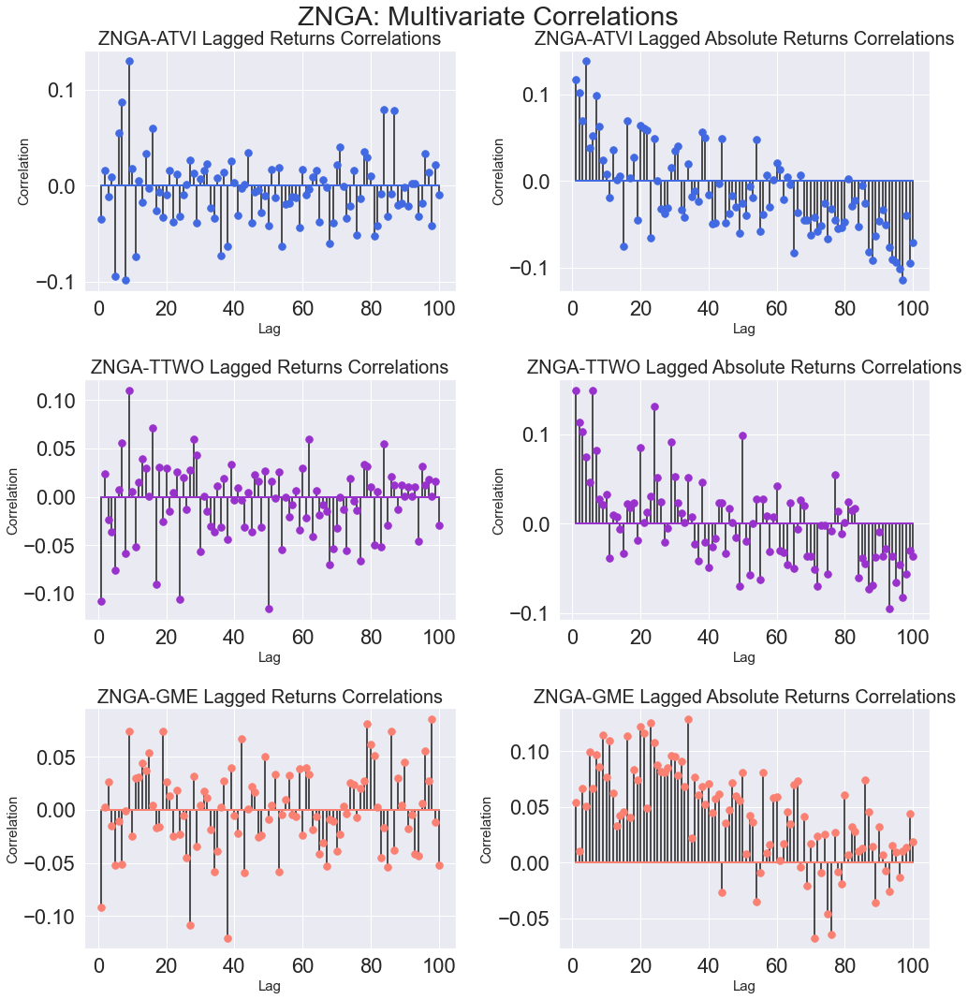

In [258]:
fig, ax = plt.subplots(3, 2, figsize=(15,15))
fig.suptitle('ZNGA: Multivariate Correlations'+'\n', y = 1)

colors = ['royalblue','darkorchid','salmon']

col1_title = " Lagged Returns Correlations"
col2_title = " Lagged Absolute Returns Correlations"

ZNGA_cross_corr_lag = pd.concat([cross_corr_lag['ZNGA-ATVI'], cross_corr_lag['ZNGA-TTWO'], cross_corr_lag['ZNGA-GME']], axis = 1)
ZNGA_cross_corr_abs_lag = pd.concat([cross_corr_abs_lag['ZNGA-ATVI'], cross_corr_abs_lag['ZNGA-TTWO'], cross_corr_abs_lag['ZNGA-GME']], axis = 1)

for j,i in enumerate([0,1,2]):
    markerline, stemlines, baseline = ax[i,0].stem(list(range(1,101)), ZNGA_cross_corr_lag.iloc[:,i].values, linefmt = "k")   
    ax[i,0].set_title(ZNGA_cross_corr_lag.columns[j] + col1_title, fontsize = 20)
    ax[i,0].set_xlabel("Lag", fontsize = 15)
    ax[i,0].set_ylabel("Correlation", fontsize = 15)
    plt.setp(baseline, color= colors[j], linewidth=2)
    plt.setp(markerline, color = colors[j], markersize = 7.5)
    
    markerline, stemlines, baseline = ax[i,1].stem(list(range(1,101)), ZNGA_cross_corr_abs_lag.iloc[:,i].values, linefmt = "k")   
    ax[i,1].set_title(ZNGA_cross_corr_abs_lag.columns[j] + col2_title, fontsize = 20)
    ax[i,1].set_xlabel("Lag", fontsize = 15)
    ax[i,1].set_ylabel("Correlation", fontsize = 15)
    plt.setp(baseline, color= colors[j], linewidth=2)
    plt.setp(markerline, color = colors[j], markersize = 7.5)
    
fig.tight_layout()

# Extreme returns in one series often coincide with extreme returns in several other series

In [139]:
df_norm = (df - df.mean())/df.std()

In [140]:
df_ext = df_norm[(df_norm.abs() > 2).any(1)]

In [141]:
er2 = pd.read_csv("Excess returns 2.csv",index_col='Date', parse_dates=True, dayfirst=True)

<ipython-input-152-7ac6652fc926>:22: UserWarning: The handle <matplotlib.lines.Line2D object at 0x000002B7424996D0> has a label of '_0' which cannot be automatically added to the legend.
  plt.legend(["_0","Movement in 4 Stocks ","Movement in 3 Stocks"])


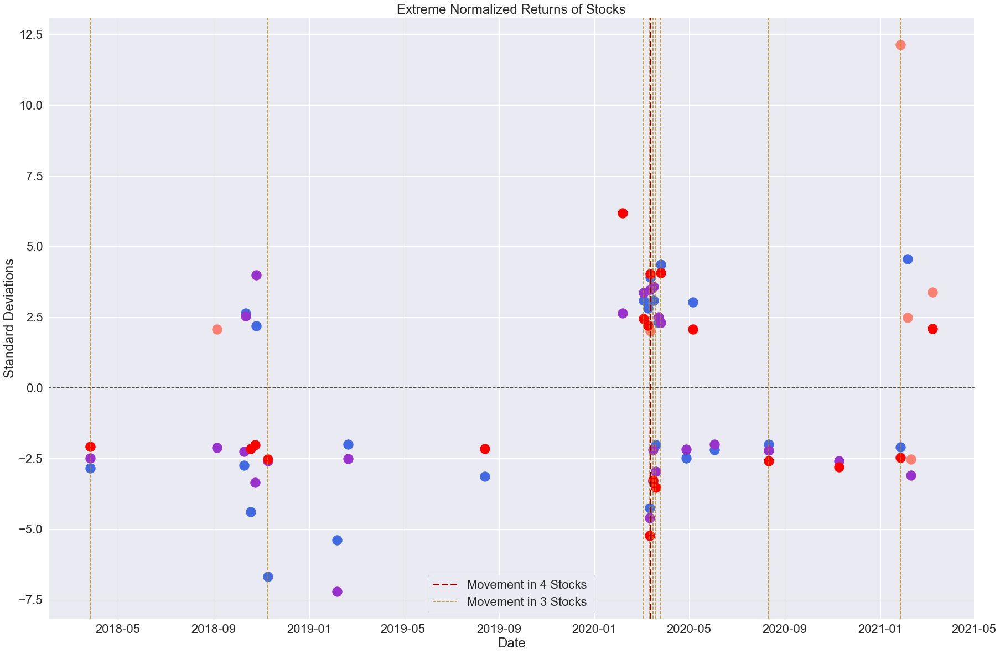

In [152]:
plt.figure(figsize=(30,20))
plt.scatter(x = er2.index, y = er2['ATVI'], color = 'royalblue', s = 300)
plt.scatter(x = er2.index, y = er2['TTWO'], color = 'darkorchid', s = 300)
plt.scatter(x = er2.index, y = er2['GME'], color = 'salmon', s = 300)
plt.scatter(x = er2.index, y = er2['ZNGA'], color = 'red', s = 300)
plt.axhline(y=0, color='k', linestyle='--')
plt.axvline(pd.to_datetime('2020-03-13'), color='darkred', linestyle='--', linewidth = 3)

plt.axvline(pd.to_datetime('2018-03-27'), color='darkgoldenrod', linestyle='--', linewidth = 1.5)
plt.axvline(pd.to_datetime('2018-11-09'), color='darkgoldenrod', linestyle='--', linewidth = 1.5)
plt.axvline(pd.to_datetime('2020-03-04'), color='darkgoldenrod', linestyle='--', linewidth = 1.5)
plt.axvline(pd.to_datetime('2020-03-12'), color='darkgoldenrod', linestyle='--', linewidth = 1.5)
plt.axvline(pd.to_datetime('2020-03-16'), color='darkgoldenrod', linestyle='--', linewidth = 1.5)
plt.axvline(pd.to_datetime('2020-03-20'), color='darkgoldenrod', linestyle='--', linewidth = 1.5)
plt.axvline(pd.to_datetime('2020-03-26'), color='darkgoldenrod', linestyle='--', linewidth = 1.5)
plt.axvline(pd.to_datetime('2020-08-11'), color='darkgoldenrod', linestyle='--', linewidth = 1.5)
plt.axvline(pd.to_datetime('2021-01-27'), color='darkgoldenrod', linestyle='--', linewidth = 1.5)

plt.title("Extreme Normalized Returns of Stocks")
plt.ylabel("Standard Deviations")
plt.xlabel("Date")
plt.legend(["_0","Movement in 4 Stocks ","Movement in 3 Stocks"])

# Correlations change with time

In [143]:
n = [0,126,252,378,504,630,757]

for i in range(6):
    print(df.iloc[n[i]:n[i+1],:].corr())
    print("\n")

          ATVI      TTWO       GME      ZNGA
ATVI  1.000000  0.628932  0.035522  0.523203
TTWO  0.628932  1.000000  0.005169  0.444282
GME   0.035522  0.005169  1.000000 -0.051644
ZNGA  0.523203  0.444282 -0.051644  1.000000


          ATVI      TTWO       GME      ZNGA
ATVI  1.000000  0.706353  0.250512  0.432642
TTWO  0.706353  1.000000  0.157014  0.452733
GME   0.250512  0.157014  1.000000  0.079636
ZNGA  0.432642  0.452733  0.079636  1.000000


          ATVI      TTWO       GME      ZNGA
ATVI  1.000000  0.548185  0.119580  0.469280
TTWO  0.548185  1.000000  0.015786  0.515528
GME   0.119580  0.015786  1.000000  0.078085
ZNGA  0.469280  0.515528  0.078085  1.000000


          ATVI      TTWO       GME      ZNGA
ATVI  1.000000  0.469558  0.212506  0.489584
TTWO  0.469558  1.000000  0.279933  0.506546
GME   0.212506  0.279933  1.000000  0.110767
ZNGA  0.489584  0.506546  0.110767  1.000000


          ATVI      TTWO       GME      ZNGA
ATVI  1.000000  0.752284  0.085365  0.702696
TT